## Importing Libraries

In [1]:
## Will Be Importing All Libraries Here.

import pandas as pd,numpy as np,seaborn as sns,matplotlib.pyplot as plt

#Importing Pandas,Numpy,Seaborn,Matplotlib.

In [2]:
## Getting Rid Of Warnings.

import warnings
warnings.filterwarnings(action='ignore')   

#This Will Ignore All Unnecessary Warnings...For Example During Seaborn Plots.

In [3]:
## Importing Scikit Learn All Used Libraries.

from sklearn.model_selection import train_test_split  #For Splitting Dataset Into Train And Test.
from sklearn.linear_model import LinearRegression   #For LinearRegression.
from sklearn.preprocessing import MinMaxScaler    #For Scaling.
from sklearn.feature_selection import RFE #For Recursive Feature Elimination
from sklearn.metrics import r2_score #For R² Score
from statsmodels.stats.outliers_influence import variance_inflation_factor  #For VIF
import statsmodels.api as sm  #For Statsmodels

## Loading Dataset

In [4]:
df = pd.read_csv('day.csv')  #Loading The 'day.csv' Dataset Provided By Upgrad.

In [5]:
df.head() #Checking The Dataset.

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,01-01-2018,1,0,1,0,1,1,2,14.110847,18.18125,80.5833,10.749882,331,654,985
1,2,02-01-2018,1,0,1,0,2,1,2,14.902598,17.68695,69.6087,16.652113,131,670,801
2,3,03-01-2018,1,0,1,0,3,1,1,8.050924,9.47025,43.7273,16.636703,120,1229,1349
3,4,04-01-2018,1,0,1,0,4,1,1,8.200000,10.60610,59.0435,10.739832,108,1454,1562
4,5,05-01-2018,1,0,1,0,5,1,1,9.305237,11.46350,43.6957,12.522300,82,1518,1600


In [6]:
## Checking Shape

df.shape

(730, 16)

In [7]:
## Checking Info

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 730 entries, 0 to 729
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     730 non-null    int64  
 1   dteday      730 non-null    object 
 2   season      730 non-null    int64  
 3   yr          730 non-null    int64  
 4   mnth        730 non-null    int64  
 5   holiday     730 non-null    int64  
 6   weekday     730 non-null    int64  
 7   workingday  730 non-null    int64  
 8   weathersit  730 non-null    int64  
 9   temp        730 non-null    float64
 10  atemp       730 non-null    float64
 11  hum         730 non-null    float64
 12  windspeed   730 non-null    float64
 13  casual      730 non-null    int64  
 14  registered  730 non-null    int64  
 15  cnt         730 non-null    int64  
dtypes: float64(4), int64(11), object(1)
memory usage: 91.4+ KB


In [8]:
# Describing Columns

df.describe()

,instant,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000
mean,365.500000,2.498630,0.500000,6.526027,0.028767,2.995890,0.690411,1.394521,20.319259,23.726322,62.765175,12.763620,849.249315,3658.757534,4508.006849
std,210.877136,1.110184,0.500343,3.450215,0.167266,2.000339,0.462641,0.544807,7.506729,8.150308,14.237589,5.195841,686.479875,1559.758728,1936.011647
min,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,2.424346,3.953480,0.000000,1.500244,2.000000,20.000000,22.000000
25%,183.250000,2.000000,0.000000,4.000000,0.000000,1.000000,0.000000,1.000000,13.811885,16.889713,52.000000,9.041650,316.250000,2502.250000,3169.750000
50%,365.500000,3.000000,0.500000,7.000000,0.000000,3.000000,1.000000,1.000000,20.465826,24.368225,62.625000,12.125325,717.000000,3664.500000,4548.500000
75%,547.750000,3.000000,1.000000,10.000000,0.000000,5.000000,1.000000,2.000000,26.880615,30.445775,72.989575,15.625589,1096.500000,4783.250000,5966.000000
max,730.000000,4.000000,1.000000,12.000000,1.000000,6.000000,1.000000,3.000000,35.328347,42.044800,97.250000,34.000021,3410.000000,6946.000000,8714.000000


In [9]:
df.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,01-01-2018,1,0,1,0,1,1,2,14.110847,18.18125,80.5833,10.749882,331,654,985
1,2,02-01-2018,1,0,1,0,2,1,2,14.902598,17.68695,69.6087,16.652113,131,670,801
2,3,03-01-2018,1,0,1,0,3,1,1,8.050924,9.47025,43.7273,16.636703,120,1229,1349
3,4,04-01-2018,1,0,1,0,4,1,1,8.200000,10.60610,59.0435,10.739832,108,1454,1562
4,5,05-01-2018,1,0,1,0,5,1,1,9.305237,11.46350,43.6957,12.522300,82,1518,1600


In [10]:
## Checking Null Values

df.isna().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

In [11]:
percentage_null = np.round((df.isnull().sum().sum()/df.size)*100,2) # using np.round to take decimal upto 2 places.
print(percentage_null,'%') # No Null Values Are There, The Dataset Is Free From Null Values.

0.0 %


In [12]:
##  Checking Size Of Data.

df.size

11680

In [13]:
## Checking Data Types Of Columns.

df.dtypes

instant         int64
dteday         object
season          int64
yr              int64
mnth            int64
holiday         int64
weekday         int64
workingday      int64
weathersit      int64
temp          float64
atemp         float64
hum           float64
windspeed     float64
casual          int64
registered      int64
cnt             int64
dtype: object

In [14]:
df.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,01-01-2018,1,0,1,0,1,1,2,14.110847,18.18125,80.5833,10.749882,331,654,985
1,2,02-01-2018,1,0,1,0,2,1,2,14.902598,17.68695,69.6087,16.652113,131,670,801
2,3,03-01-2018,1,0,1,0,3,1,1,8.050924,9.47025,43.7273,16.636703,120,1229,1349
3,4,04-01-2018,1,0,1,0,4,1,1,8.200000,10.60610,59.0435,10.739832,108,1454,1562
4,5,05-01-2018,1,0,1,0,5,1,1,9.305237,11.46350,43.6957,12.522300,82,1518,1600


In [15]:
## Checking Dimensions

df.ndim

2

In [16]:
## Checking Duplicates

df.duplicated().sum()

0

In [17]:
## renaming some columns for better readibility

df.rename(columns={'yr':'year','mnth':'month','hum':'humidity','temp':'temperature'}, inplace=True)

# Renaming 'yr' to 'year' , 'mnth' to 'month' , 'hum' to 'humidity' , 'temp' to 'temperature'.

In [18]:
df.head()

,instant,dteday,season,year,month,holiday,weekday,workingday,weathersit,temperature,atemp,humidity,windspeed,casual,registered,cnt
0,1,01-01-2018,1,0,1,0,1,1,2,14.110847,18.18125,80.5833,10.749882,331,654,985
1,2,02-01-2018,1,0,1,0,2,1,2,14.902598,17.68695,69.6087,16.652113,131,670,801
2,3,03-01-2018,1,0,1,0,3,1,1,8.050924,9.47025,43.7273,16.636703,120,1229,1349
3,4,04-01-2018,1,0,1,0,4,1,1,8.200000,10.60610,59.0435,10.739832,108,1454,1562
4,5,05-01-2018,1,0,1,0,5,1,1,9.305237,11.46350,43.6957,12.522300,82,1518,1600


## Droping Columns That Are Not Useful For Analysis.

In [19]:
#  Dropping the unwanted columns.
# 'instant' has only index number for the row, 'dteday' has date which can be compensated by 'year' and 'month' column.
#  Dropping 'casual' and 'registered' columnsa as we have cnt column which is sum of the both that is the target column.

df.drop(['instant','dteday','casual','registered'],axis=1,inplace=True)

In [20]:
df.head()

,season,year,month,holiday,weekday,workingday,weathersit,temperature,atemp,humidity,windspeed,cnt
0,1,0,1,0,1,1,2,14.110847,18.18125,80.5833,10.749882,985
1,1,0,1,0,2,1,2,14.902598,17.68695,69.6087,16.652113,801
2,1,0,1,0,3,1,1,8.050924,9.47025,43.7273,16.636703,1349
3,1,0,1,0,4,1,1,8.200000,10.60610,59.0435,10.739832,1562
4,1,0,1,0,5,1,1,9.305237,11.46350,43.6957,12.522300,1600


In [21]:
df.columns

Index(['season', 'year', 'month', 'holiday', 'weekday', 'workingday',
       'weathersit', 'temperature', 'atemp', 'humidity', 'windspeed', 'cnt'],
      dtype='object')

In [22]:
# season,month,weekday,weathersit.

In [23]:
df.season #Checking Variables

0      1
1      1
2      1
3      1
4      1
      ..
725    1
726    1
727    1
728    1
729    1
Name: season, Length: 730, dtype: int64

In [24]:
df.month #Checking Variables

0       1
1       1
2       1
3       1
4       1
       ..
725    12
726    12
727    12
728    12
729    12
Name: month, Length: 730, dtype: int64

In [25]:
df.weekday #Checking Variables

0      1
1      2
2      3
3      4
4      5
      ..
725    5
726    6
727    0
728    1
729    2
Name: weekday, Length: 730, dtype: int64

In [26]:
df.weathersit #Checking Variables

0      2
1      2
2      1
3      1
4      1
      ..
725    2
726    2
727    2
728    1
729    2
Name: weathersit, Length: 730, dtype: int64

In [27]:
## We Can Map Or Encode The Above Columns By Either Using 'Map' Or 'Replace'.
## Will Be Using Both To Show How It Works.

In [28]:
df.season = df.season.map({1:'Spring', 2:'Summer', 3:'Fall', 4:'Winter'})  #Encoding Or Mapping 'season' Column

In [29]:
df.month = df.month.replace({1:'Jan',2:'Feb',3:'Mar',4:'Apr',5:'May',6:'June',7:'July',8:'Aug',9:'Sep',10:'Oct',11:'Nov',12:'Dec'})

#Encoding Or Mapping 'month' Column Using 'replace'.

In [30]:
df.weekday = df.weekday.map({0:'Sun',1:'Mon',2:'Tue',3:'Wed',4:'Thu',5:'Fri',6:'Sat'}) #Encoding Or Mapping 'weekday' Column

df.weathersit = df.weathersit.map({1:'Clear',2:'Misty',3:'Light_snowrain',4:'Heavy_snowrain'}) #Encoding Or Mapping 'weathersit' Column

In [31]:
df.holiday.value_counts() #Contains Only Two Types Of Values, Either 0 or 1 (yes or no).

0    709
1     21
Name: holiday, dtype: int64

In [32]:
df.year.value_counts() #Contains Only Two Types Of Values, Either 0 or 1 (2018 or 2019).

0    365
1    365
Name: year, dtype: int64

In [33]:
df.workingday.value_counts() #Contains Only Two Types Of Values, Either 0 or 1 (yes or no).

1    504
0    226
Name: workingday, dtype: int64

In [34]:
# Converting Some Columns To Categorical Variable And Adding New Flag Columns.
# Creating Flags Just For Making Visualisation More Readable.

df['holiday_flag']=df.holiday.replace({1:'Yes',0:'No'})
df['year_flag']=df.year.replace({1:'2019',0:'2018'})
df['workingday_flag']=df.workingday.replace({1:'Yes',0:'No'})

In [35]:
df.head() 

,season,year,month,holiday,weekday,workingday,weathersit,temperature,atemp,humidity,windspeed,cnt,holiday_flag,year_flag,workingday_flag
0,Spring,0,Jan,0,Mon,1,Misty,14.110847,18.18125,80.5833,10.749882,985,No,2018,Yes
1,Spring,0,Jan,0,Tue,1,Misty,14.902598,17.68695,69.6087,16.652113,801,No,2018,Yes
2,Spring,0,Jan,0,Wed,1,Clear,8.050924,9.47025,43.7273,16.636703,1349,No,2018,Yes
3,Spring,0,Jan,0,Thu,1,Clear,8.200000,10.60610,59.0435,10.739832,1562,No,2018,Yes
4,Spring,0,Jan,0,Fri,1,Clear,9.305237,11.46350,43.6957,12.522300,1600,No,2018,Yes


## Data Visualization 

### All Below Columns Have Numerical Values

In [36]:
numerical_values_col=(df.dtypes == 'int64') | (df.dtypes == int) | (df.dtypes == float) | (df.dtypes == 'float64')
numerical_var = numerical_values_col[numerical_values_col].index
print(f'Number Of Columns Having Numerical Values Are {numerical_values_col[numerical_values_col].count()}')
list(numerical_var)

# Note - We Have Converted Numerical(1,0) To Flag(Y,N) Columns And Assigned New Columns To Them,Hence Its Showing Some Increased Columns.

Number Of Columns Having Numerical Values Are 8


['year',
 'holiday',
 'workingday',
 'temperature',
 'atemp',
 'humidity',
 'windspeed',
 'cnt']

### All Below Columns Have Categorical Values

In [37]:
object_values_col=(df.dtypes == 'object') | (df.dtypes =='category')
print(f'Number Of Columns Having Categorical Values Are {object_values_col[object_values_col].count()}')
categorical_Val = object_values_col[object_values_col].index
list(categorical_Val)

Number Of Columns Having Categorical Values Are 7


['season',
 'month',
 'weekday',
 'weathersit',
 'holiday_flag',
 'year_flag',
 'workingday_flag']

### Univariate Analysis

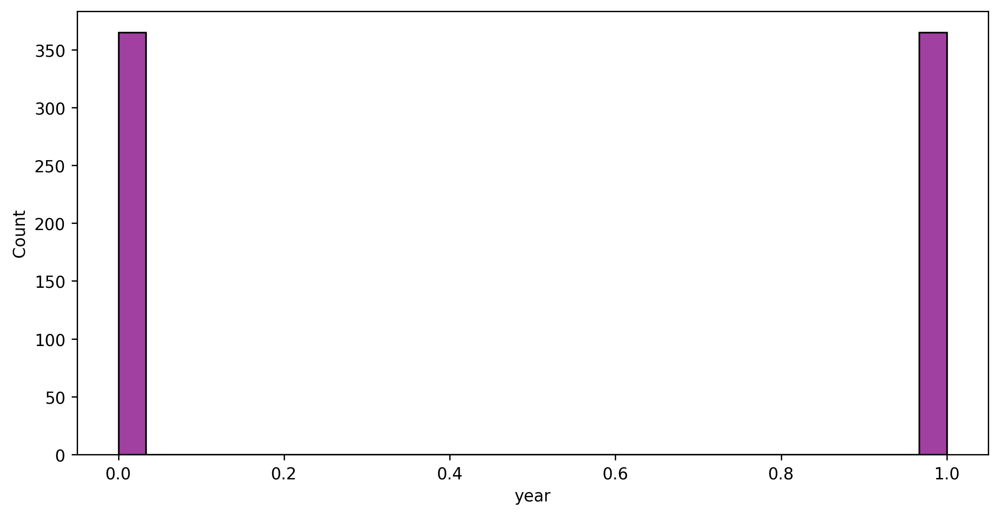

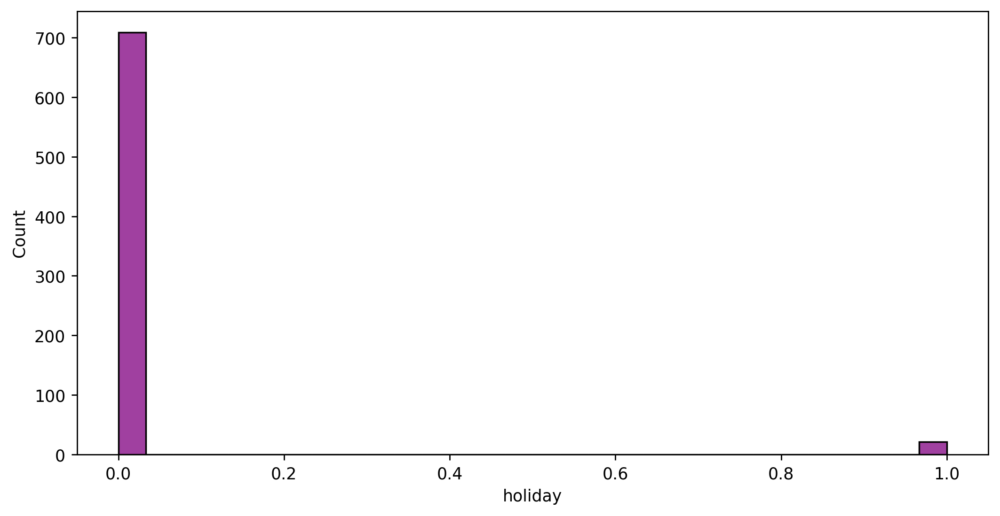

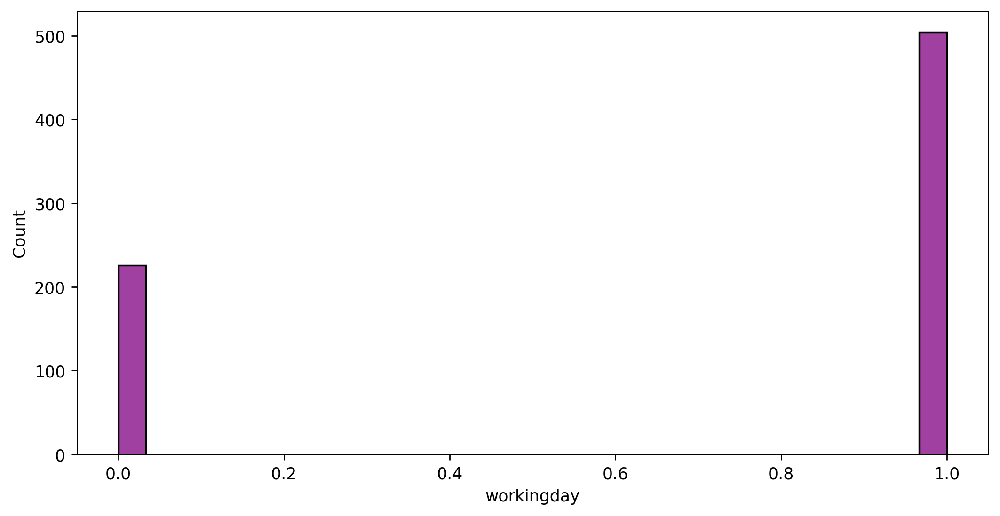

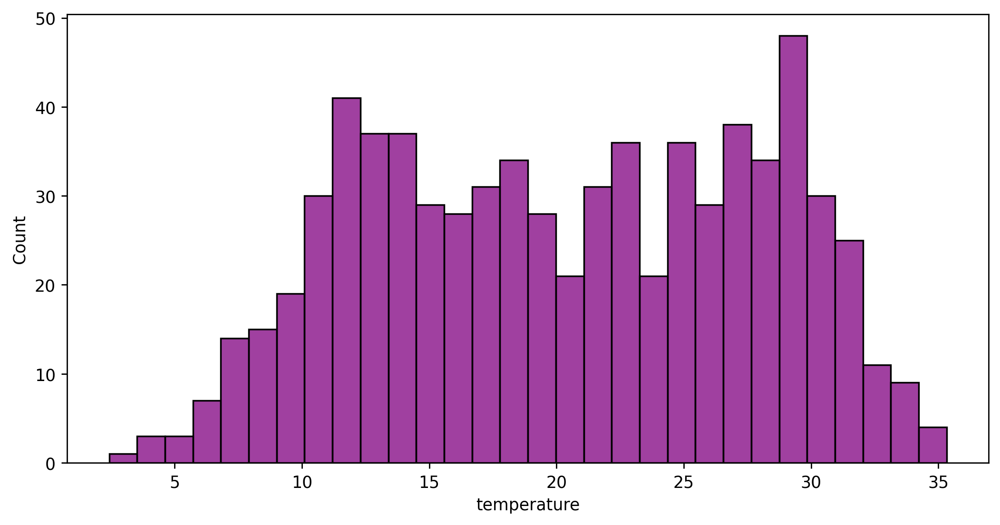

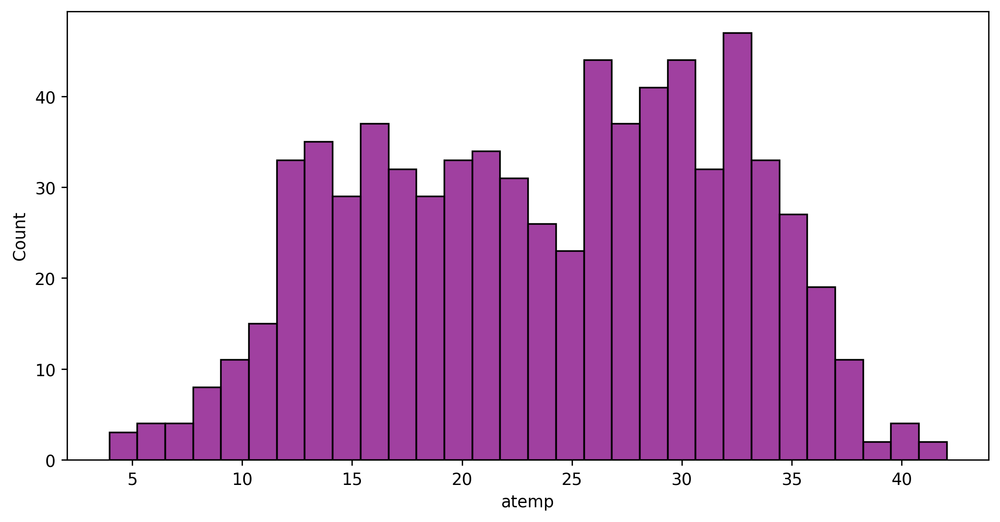

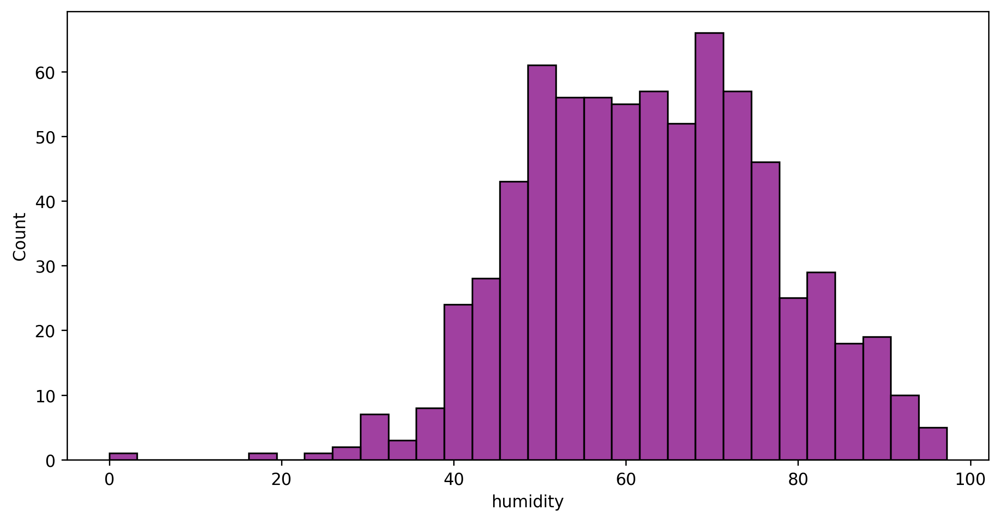

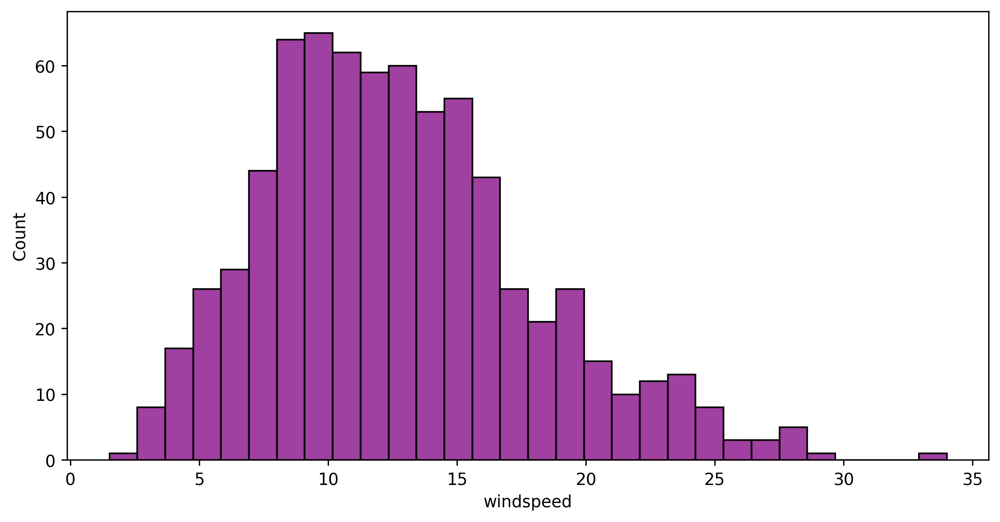

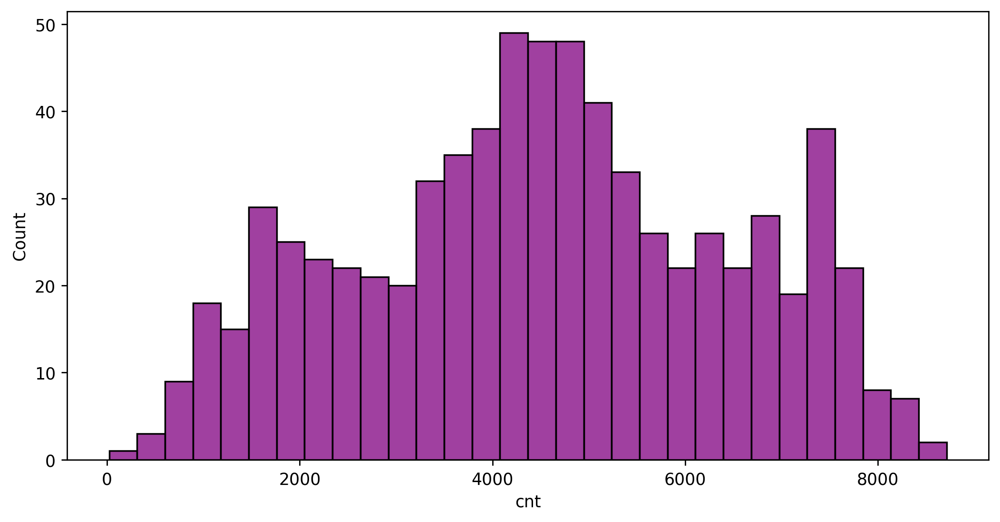

In [38]:
# Univariate Analysis Of Numerical Variable (Hist Plot).

for i in numerical_var:
    plt.figure(figsize=(10,5),dpi=250)
    sns.histplot(df[i],color='purple',bins=30) #Going With 30 bins.
    plt.show()
    
# Instead Of Using 'plt.show()' We Can Also Use ';'.

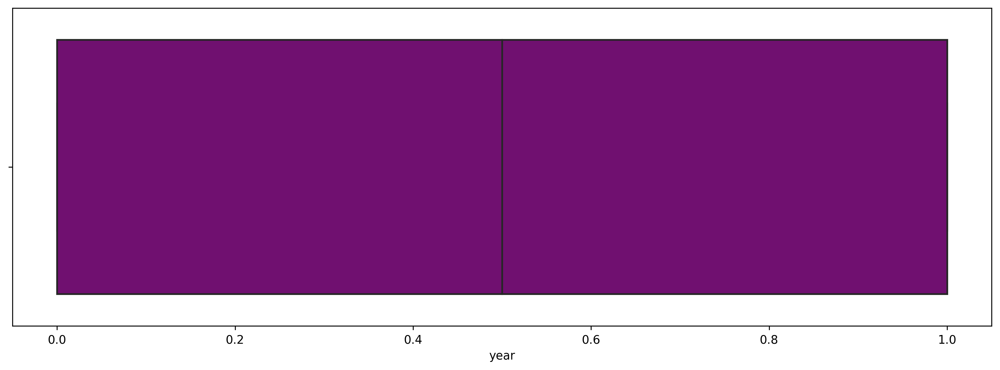

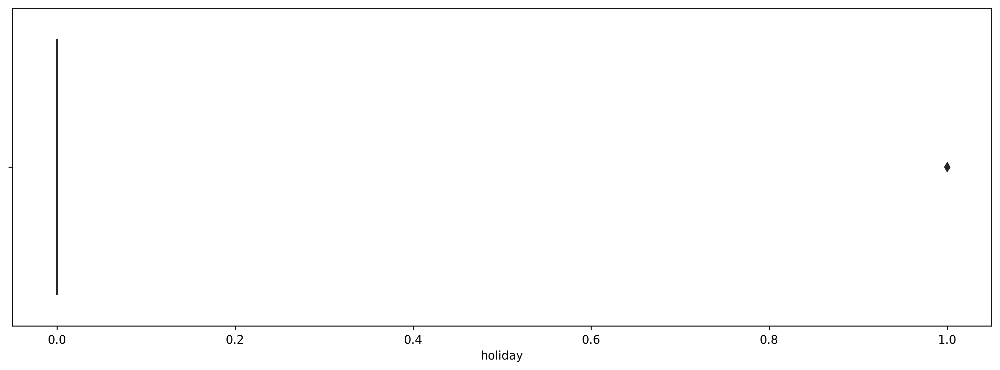

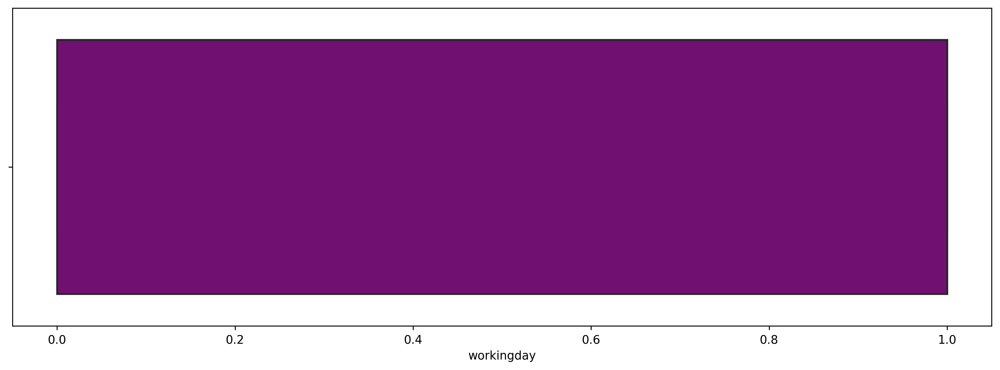

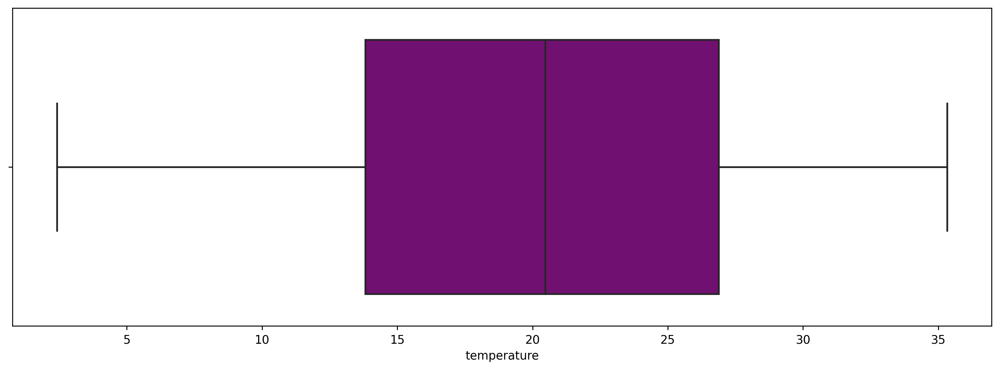

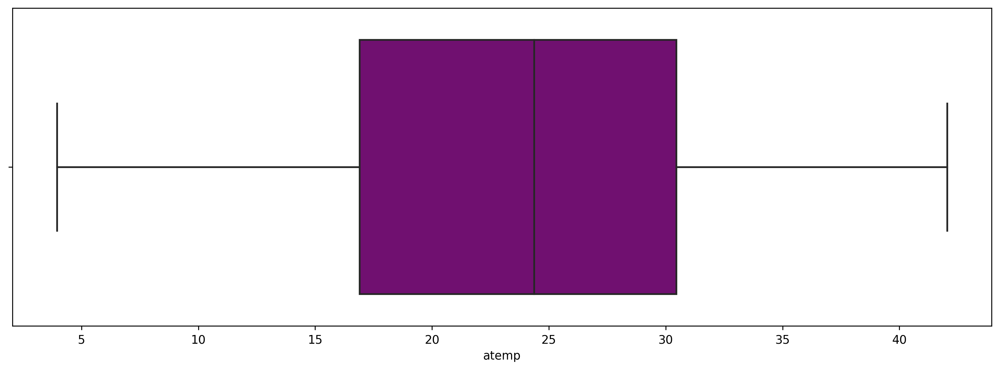

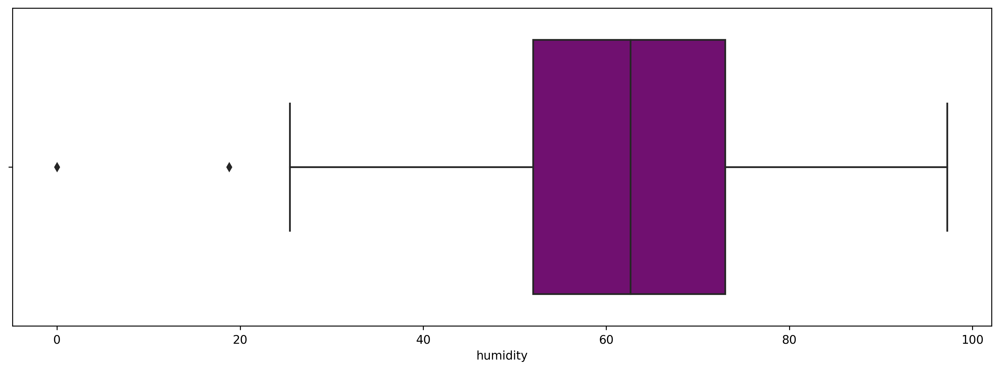

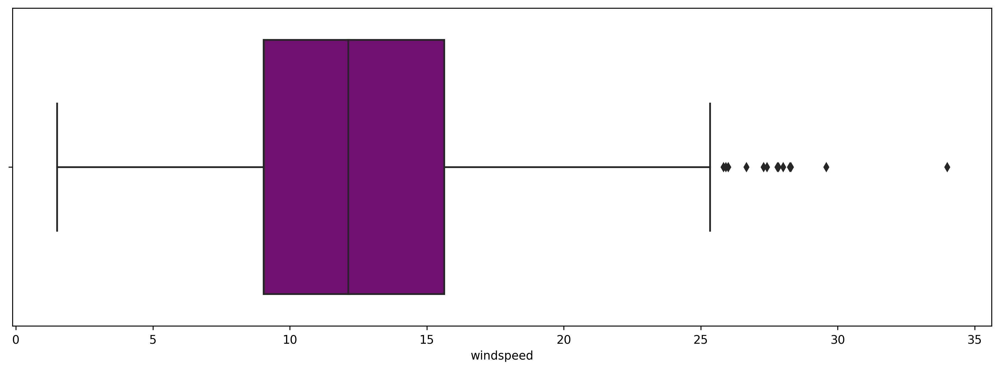

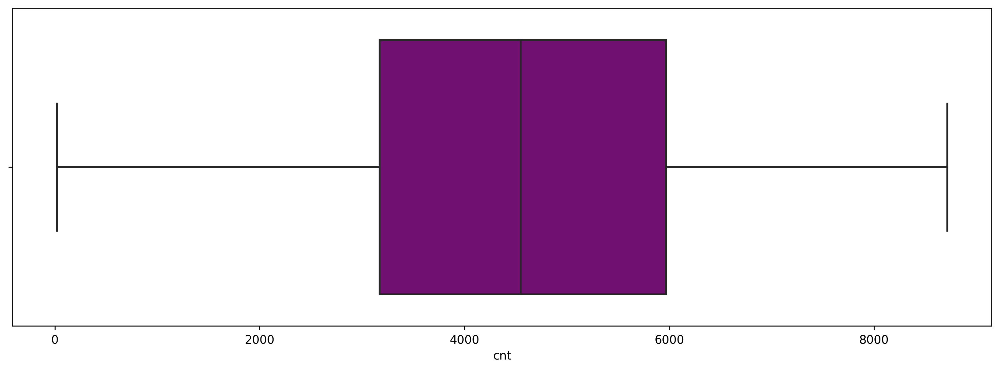

In [39]:
# Univariate Analysis Of Numerical Variable (Box Plot).

for i in numerical_var:
    plt.figure(figsize=(15,5),dpi=250)
    sns.boxplot(df[i],color='Purple')
    plt.show()

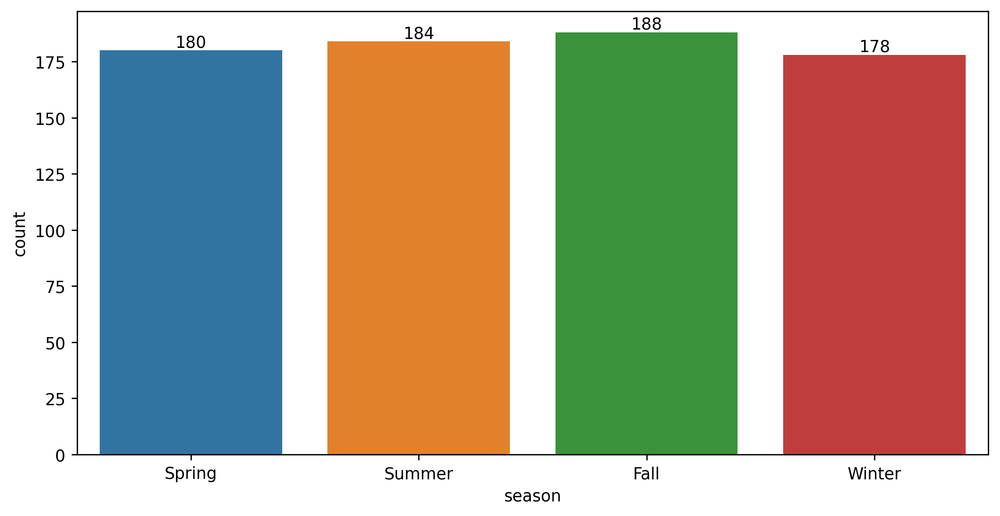

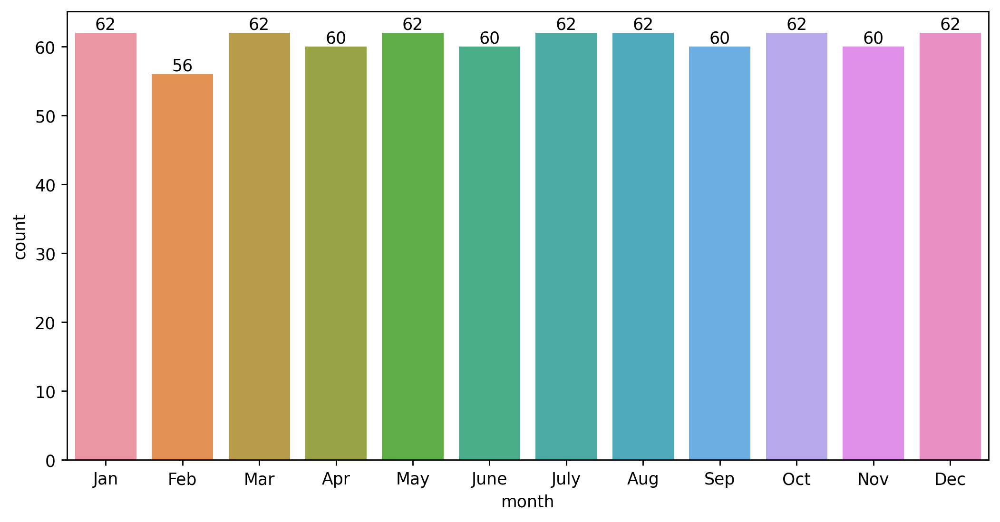

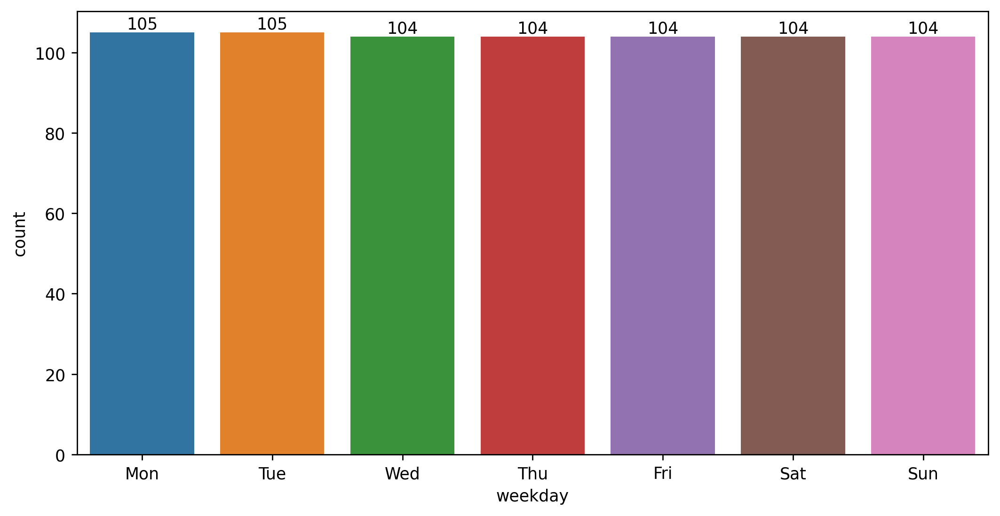

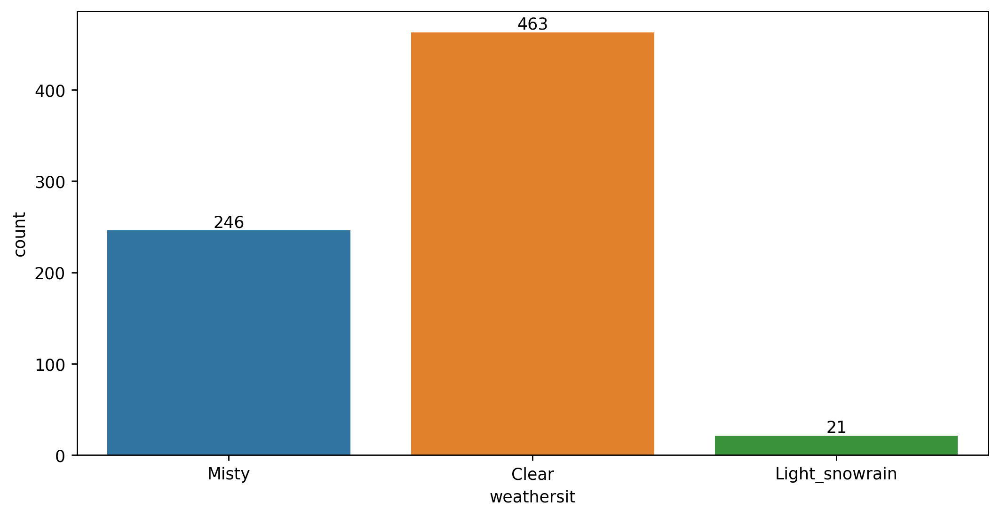

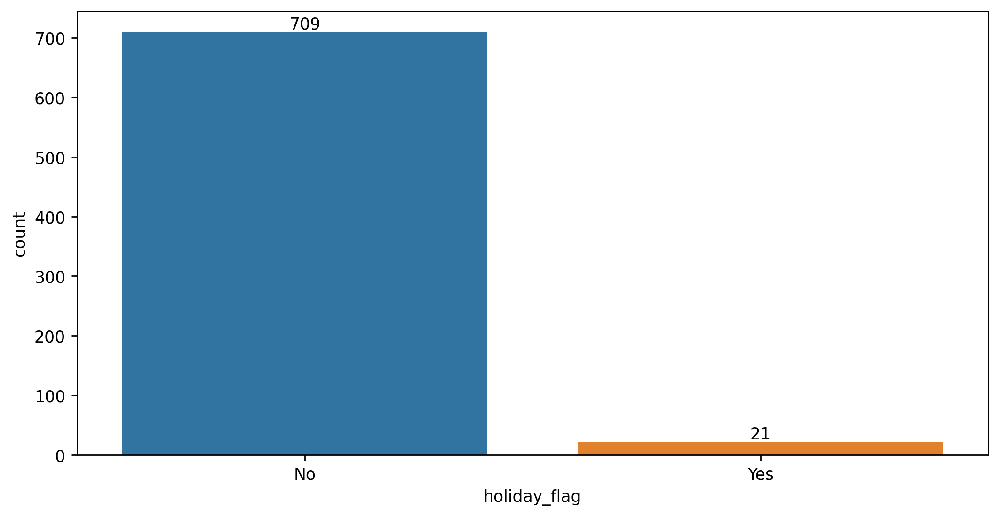

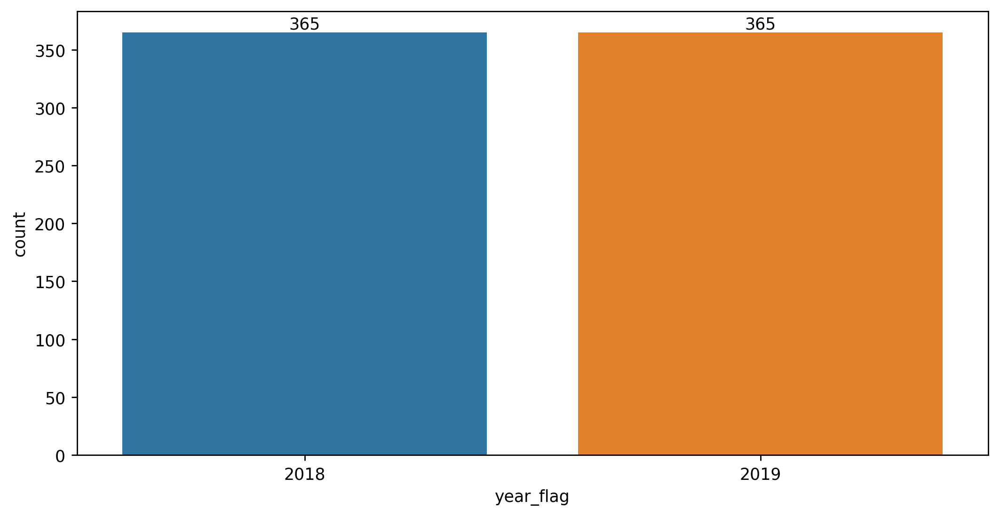

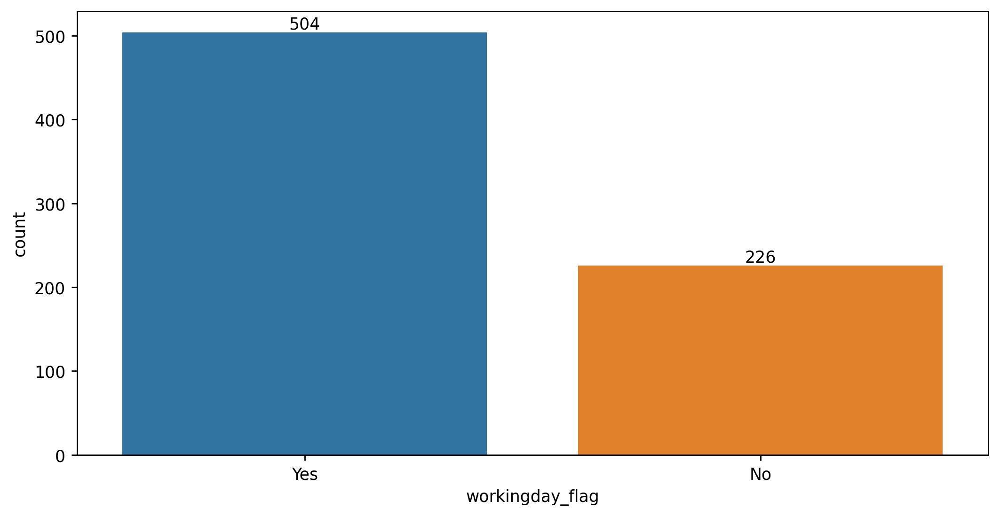

In [40]:
# Univariate Analysis Of Categorical Variable.

for i in categorical_Val:
    plt.figure(figsize=(10,5),dpi=250)
    a = sns.countplot(df[i])
    plt.bar_label(a.containers[0])
    plt.show()

### Bivariate Analysis

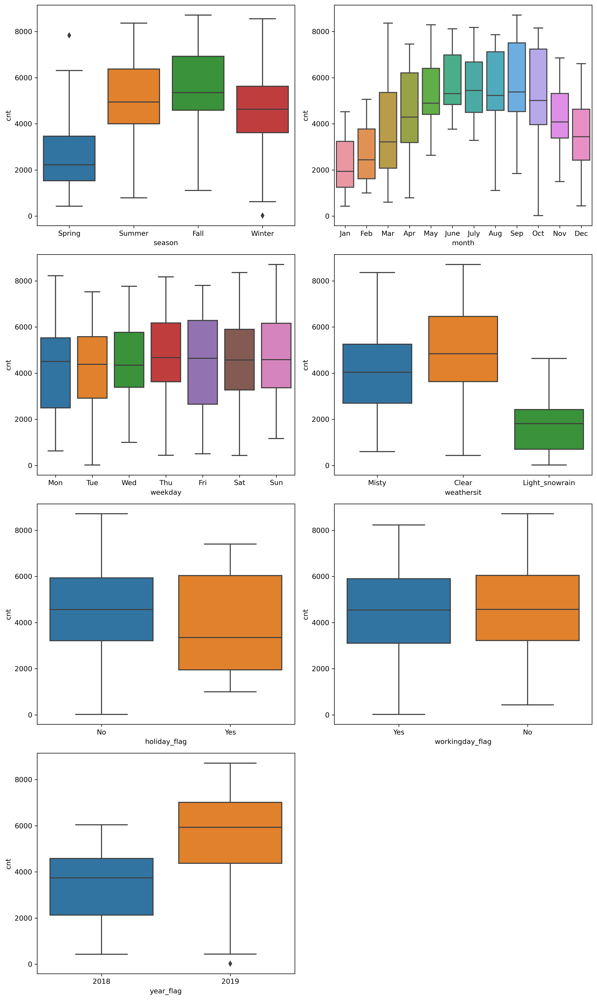

In [41]:
# visualizing Categorical Variable.
# Independent Variables v/s Dependent Variables.
# Features v/s Labels.
# This Time Using Subplot.

plt.figure(figsize=(12, 20),dpi=300)
plt.subplot(4,2,1)
sns.boxplot(x = 'season', y = 'cnt', data = df)
plt.subplot(4,2,2)
sns.boxplot(x = 'month', y = 'cnt', data = df)
plt.subplot(4,2,3)
sns.boxplot(x = 'weekday', y = 'cnt', data = df)
plt.subplot(4,2,4)
sns.boxplot(x = 'weathersit', y = 'cnt', data = df)
plt.subplot(4,2,5)
sns.boxplot(x = 'holiday_flag', y = 'cnt', data = df)
plt.subplot(4,2,6)
sns.boxplot(x = 'workingday_flag', y = 'cnt', data = df)
plt.subplot(4,2,7)
sns.boxplot(x = 'year_flag', y = 'cnt', data = df)
plt.tight_layout()
plt.show()

#### _`Conclusion From Above Plots`_:
    These Insights can be drawn :-

    1. Season: 3rd : 'Fall' has highest demand for rental bikes.
    2. Demand is continuously growing each month till June. September month has highest demand. After September, demand is              decreasing.
    3. Weekday is not giving clear picture abount demand.
    4. The 'clear' weathershit has highest demand and 'Light_snowrain' has lowest.
    5. When there is a holiday, demand has decreased.
    6. I see that demand for next year has grown.

In [42]:
df.workingday_flag.value_counts()

Yes    504
No     226
Name: workingday_flag, dtype: int64

In [43]:
# Creating A Function For Visualizing Categorial Variable In Terms Of Barplot.

def cat_col(column,rot=0,rot1=0):
    plt.figure(figsize = (15,6),dpi=300)
    plt.subplot(1,2,1)
    y = sns.barplot(column,'cnt',data=df, palette='PuRd_r')
    plt.bar_label(y.containers[0],label_type='center',rotation=rot)
    plt.subplot(1,2,2)
    x = sns.barplot(column,'cnt',data=df, hue='year_flag', palette='Purples')
    plt.bar_label(x.containers[0],label_type='center',rotation=rot1)
    plt.bar_label(x.containers[1],label_type='center',rotation=rot1)
    plt.show()

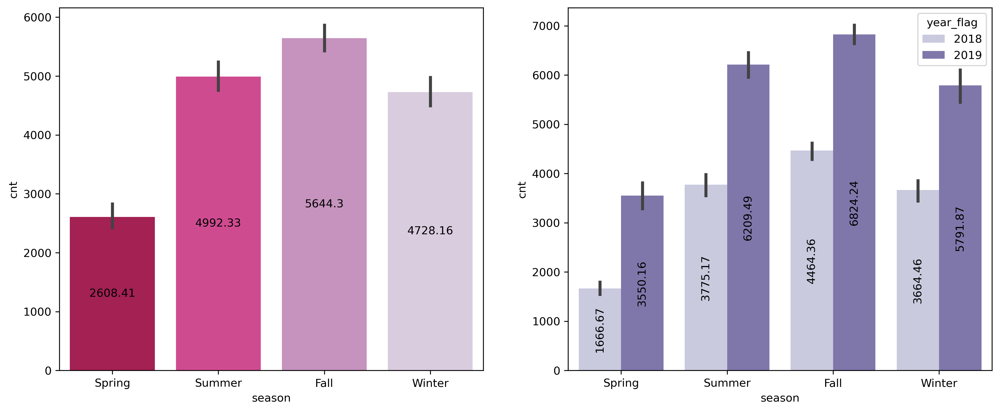

In [44]:
cat_col('season',rot1=90) #Plotting For 'season' Column.

# Can Be Seen Below, How Demand Of Bikes With 'Season' Increasing With 'Year'.

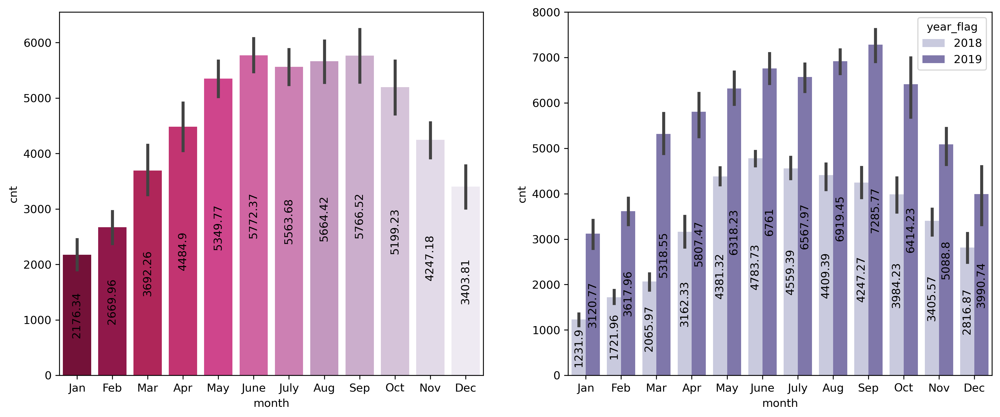

In [45]:
cat_col('month',rot=90,rot1=90) #Plotting For 'month' Column.

# Can Be Seen Below, How Demand Of Bikes With 'month' Increasing With 'Year'.

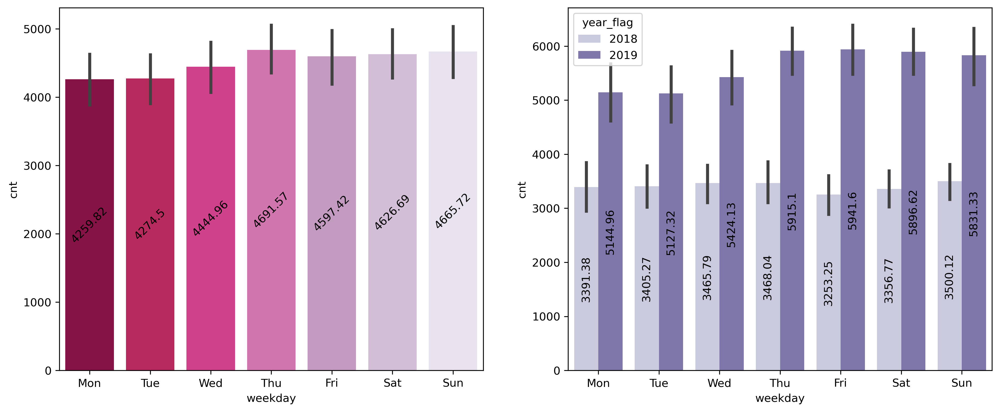

In [46]:
cat_col('weekday',rot=45,rot1=90) #Plotting For 'weekday' Column.

# Can Be Seen Below, How Demand Of Bikes With 'weekday' Increasing With 'Year'.
# In 2018 Everything Looks So Neutral But In 2019 Demand Of Bikes Increases From 'Thursday' To 'Sunday'.

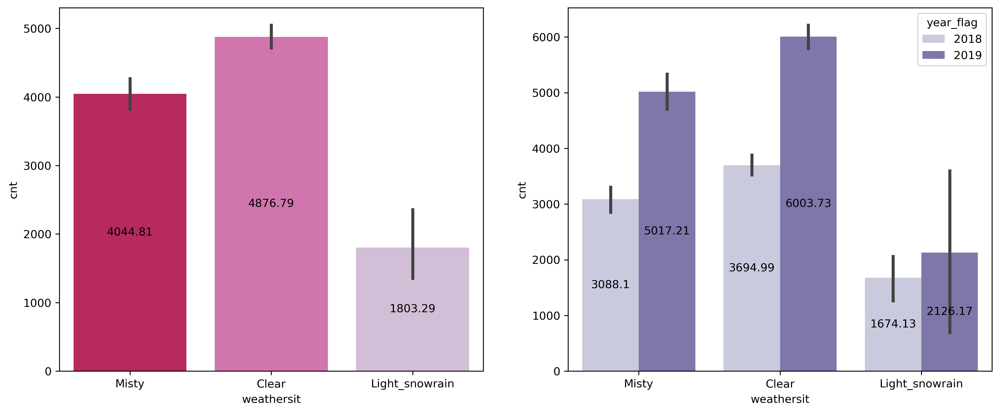

In [47]:
cat_col('weathersit') #Plotting For 'weathersit' Column.

# Can Be Seen Below, How Demand Of Bikes With 'weathersit' Increasing With 'Year'.
# The Difference Can Be Clearly Seen In 'Clear' Weather.

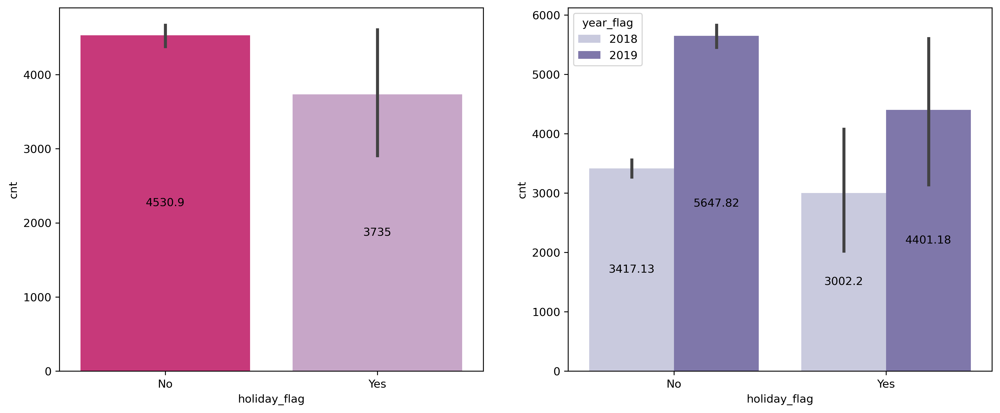

In [48]:
cat_col('holiday_flag') #Plotting For 'holiday_flag' Column.

# Can Be Seen Below, How Demand Of Bikes With 'month' Increasing With 'Year'.
# Demand Of Bikes Is Highly Decreasing With 'Year' During 'Holiday'.

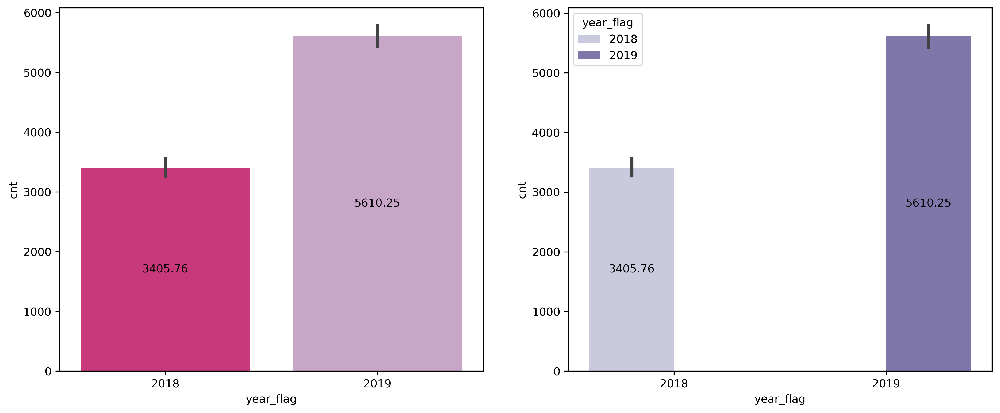

In [49]:
cat_col('year_flag') #Plotting For 'year_flag' Column.

# Can Be Seen Below, How Demand Of Bikes With 'Year' Is Increasing.

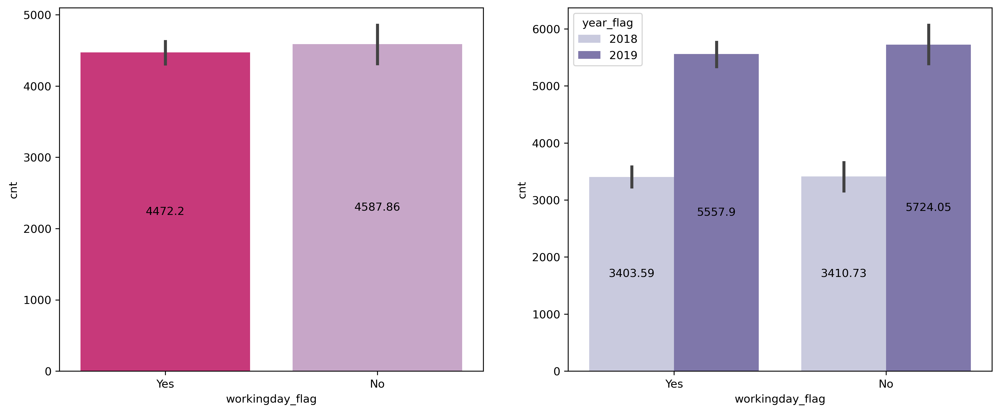

In [50]:
cat_col('workingday_flag') #Plotting For 'workingday_flag' Column.

# Can Be Seen Below, How Demand Of Bikes With 'workingday' Slightly Decreasing With 'Year'.

In [51]:
df.head()

,season,year,month,holiday,weekday,workingday,weathersit,temperature,atemp,humidity,windspeed,cnt,holiday_flag,year_flag,workingday_flag
0,Spring,0,Jan,0,Mon,1,Misty,14.110847,18.18125,80.5833,10.749882,985,No,2018,Yes
1,Spring,0,Jan,0,Tue,1,Misty,14.902598,17.68695,69.6087,16.652113,801,No,2018,Yes
2,Spring,0,Jan,0,Wed,1,Clear,8.050924,9.47025,43.7273,16.636703,1349,No,2018,Yes
3,Spring,0,Jan,0,Thu,1,Clear,8.200000,10.60610,59.0435,10.739832,1562,No,2018,Yes
4,Spring,0,Jan,0,Fri,1,Clear,9.305237,11.46350,43.6957,12.522300,1600,No,2018,Yes


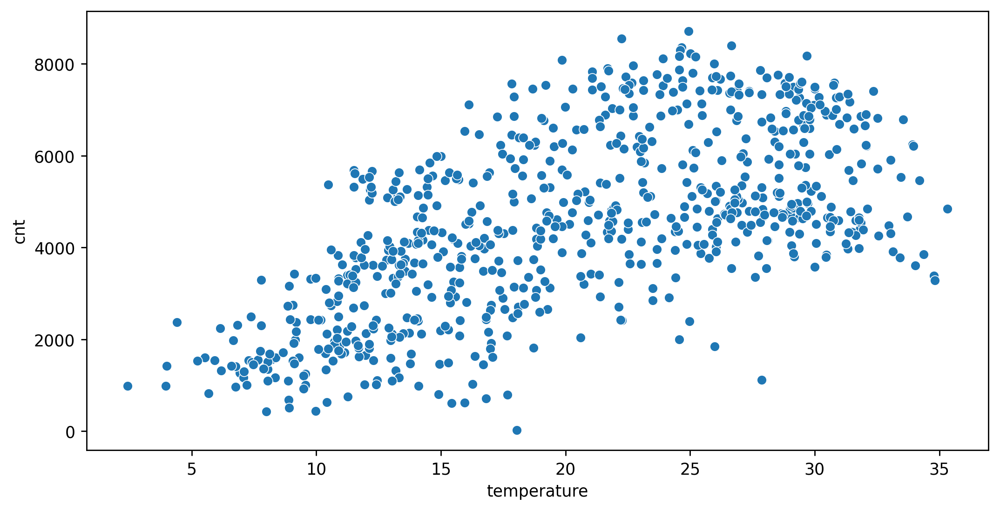

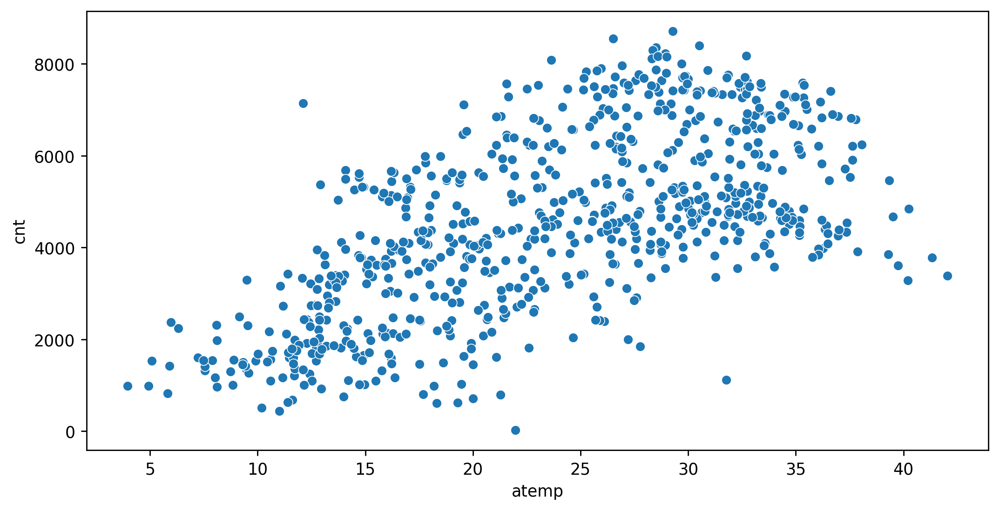

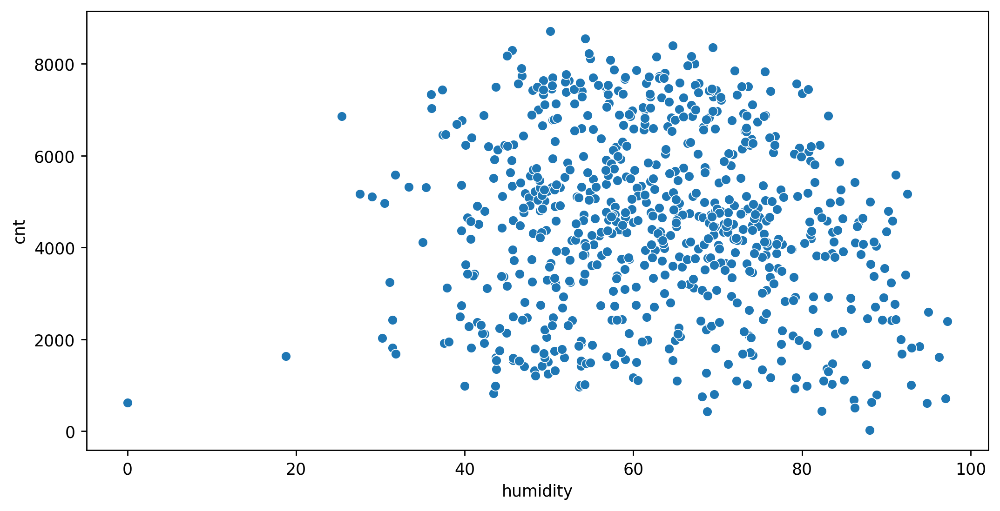

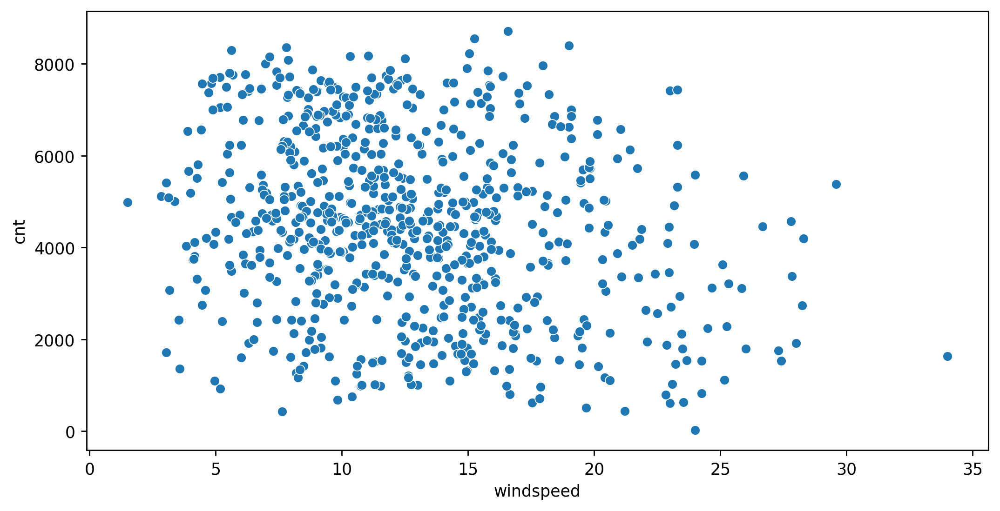

In [52]:
# Bivariate Analysis Of 'cnt' v/s ['temperature','atemp','humidity','windspeed']   (Continuous Variables)

nv = ['temperature','atemp','humidity','windspeed']
for i in nv:
    plt.figure(figsize=(10,5),dpi=250)
    sns.scatterplot(df[i],df['cnt'])   #Using Scatterplot.
    plt.show()
    
# 'temperature' And 'atemp' showing 'linear' relationship with 'cnt'.
# 'humidity' And 'windspeed' showing 'Inverse' relationship with 'cnt'.

<Figure size 1500x3000 with 0 Axes>

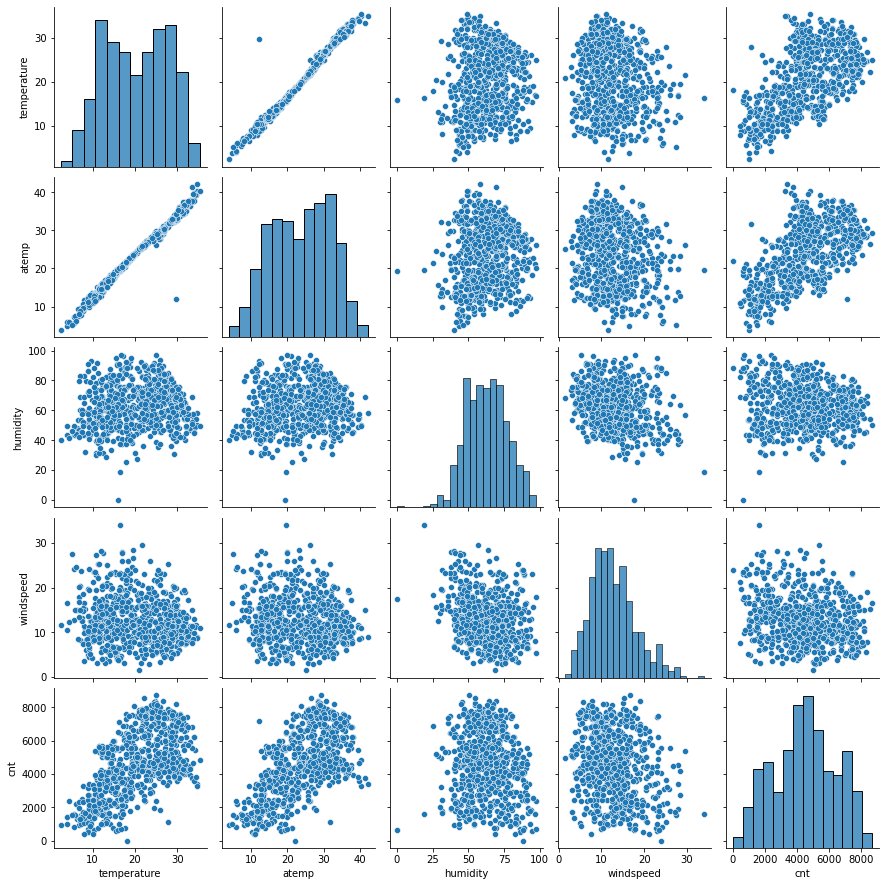

In [53]:
## Among The Given Columns Only ['temperature','atemp','humidity','windspeed','cnt'] Have Numerical Values Without Flag.

plt.figure(figsize=(5,10),dpi=300)
sns.pairplot(vars=['temperature','atemp','humidity','windspeed','cnt'],data = df) #Using Pairplot.
plt.show()

## Instead Of Using plt.show() ,we can also use ';' at the end of the code.

In [54]:
# ['temperature','atemp','humidity','windspeed','cnt']

In [55]:
# Preparing For Correlation

num_col = ['temperature','atemp','humidity','windspeed','cnt']

In [56]:
num_col

['temperature', 'atemp', 'humidity', 'windspeed', 'cnt']

In [57]:
df[num_col]

,temperature,atemp,humidity,windspeed,cnt
0,14.110847,18.18125,80.5833,10.749882,985
1,14.902598,17.68695,69.6087,16.652113,801
2,8.050924,9.47025,43.7273,16.636703,1349
3,8.200000,10.60610,59.0435,10.739832,1562
4,9.305237,11.46350,43.6957,12.522300,1600
...,...,...,...,...,...
725,10.420847,11.33210,65.2917,23.458911,2114
726,10.386653,12.75230,59.0000,10.416557,3095
727,10.386653,12.12000,75.2917,8.333661,1341
728,10.489153,11.58500,48.3333,23.500518,1796


## Checking For Correlation

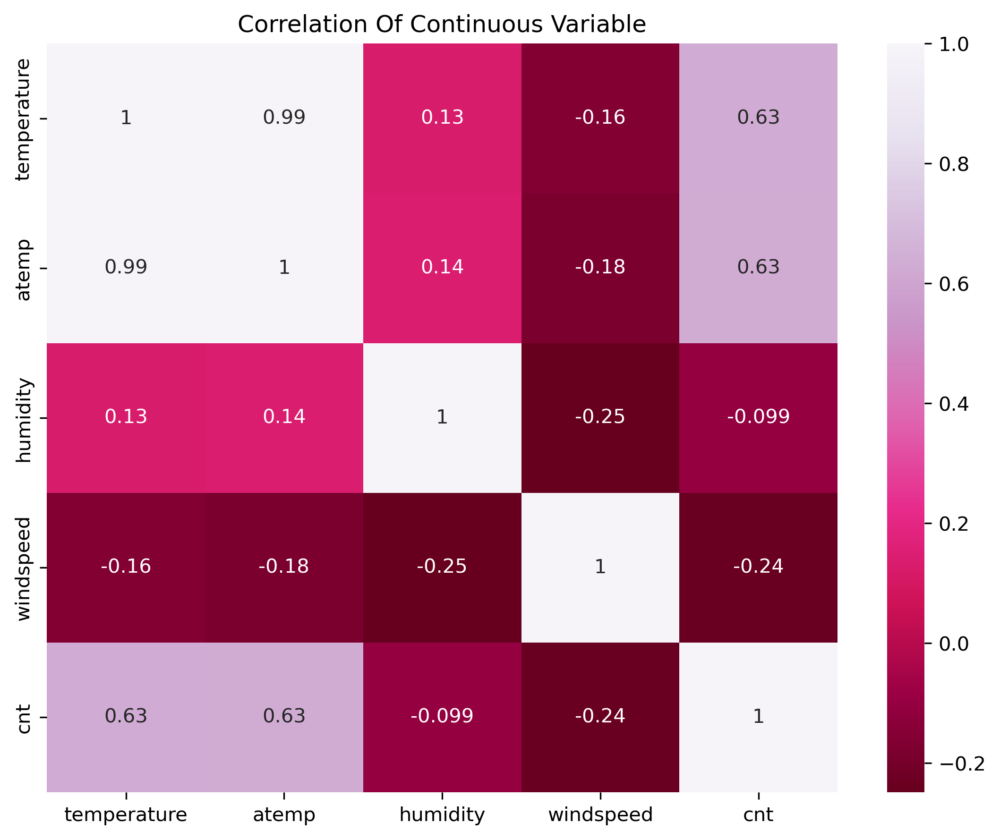

In [58]:
plt.figure(figsize=(9,7),dpi=300)
sns.heatmap(df[num_col].corr(),annot=True,cmap='PuRd_r')
plt.title('Correlation Of Continuous Variable');

In [59]:
# As It Can Be Seen Above That There is A Linear Relationship Between 'temperature' and 'atemp'.
# Both of the Variables cannot be used in the model due to 'multicolinearity' As It Would Result In 'OverFitting'.
# We will decide which parameter to keep based on VIF and p-value with respect to other columns.

## Preparing Data & Creating Dummy Variable.

In [60]:
df.head()

,season,year,month,holiday,weekday,workingday,weathersit,temperature,atemp,humidity,windspeed,cnt,holiday_flag,year_flag,workingday_flag
0,Spring,0,Jan,0,Mon,1,Misty,14.110847,18.18125,80.5833,10.749882,985,No,2018,Yes
1,Spring,0,Jan,0,Tue,1,Misty,14.902598,17.68695,69.6087,16.652113,801,No,2018,Yes
2,Spring,0,Jan,0,Wed,1,Clear,8.050924,9.47025,43.7273,16.636703,1349,No,2018,Yes
3,Spring,0,Jan,0,Thu,1,Clear,8.200000,10.60610,59.0435,10.739832,1562,No,2018,Yes
4,Spring,0,Jan,0,Fri,1,Clear,9.305237,11.46350,43.6957,12.522300,1600,No,2018,Yes


In [61]:
list(categorical_Val) #These Are All Categorical Variables.

['season',
 'month',
 'weekday',
 'weathersit',
 'holiday_flag',
 'year_flag',
 'workingday_flag']

In [62]:
val_cnt = ['season',
 'month',
 'weekday',
 'weathersit',
 'holiday_flag',
 'year_flag',
 'workingday_flag']

for i in val_cnt:
    co = df[[i]].value_counts()
    print(co,'\n\n','Number Of Different Values = ',len(co) , ' \n\n\n ')
    
# Just Checking Type Of Values Present In Each Varibles..To Execute Dummy Creation, Ignoring Flags.

season
Fall      188
Summer    184
Spring    180
Winter    178
dtype: int64 

 Number Of Different Values =  4  


 
month
Aug      62
Dec      62
Jan      62
July     62
Mar      62
May      62
Oct      62
Apr      60
June     60
Nov      60
Sep      60
Feb      56
dtype: int64 

 Number Of Different Values =  12  


 
weekday
Mon        105
Tue        105
Fri        104
Sat        104
Sun        104
Thu        104
Wed        104
dtype: int64 

 Number Of Different Values =  7  


 
weathersit    
Clear             463
Misty             246
Light_snowrain     21
dtype: int64 

 Number Of Different Values =  3  


 
holiday_flag
No              709
Yes              21
dtype: int64 

 Number Of Different Values =  2  


 
year_flag
2018         365
2019         365
dtype: int64 

 Number Of Different Values =  2  


 
workingday_flag
Yes                504
No                 226
dtype: int64 

 Number Of Different Values =  2  


 


In [63]:
# season,month,weekday,weathersit and Ignoring Flag Variables...

In [64]:
# Creating Dummy Variable For The Above Columns.

months_dum = pd.get_dummies(df.month,drop_first=True)
weekdays_dum = pd.get_dummies(df.weekday,drop_first=True)
weathersit_dum = pd.get_dummies(df.weathersit,drop_first=True)
seasons_dum = pd.get_dummies(df.season,drop_first=True)

In [65]:
months_dum.head() #month dummy.

,Aug,Dec,Feb,Jan,July,June,Mar,May,Nov,Oct,Sep
0,0,0,0,1,0,0,0,0,0,0,0
1,0,0,0,1,0,0,0,0,0,0,0
2,0,0,0,1,0,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,0


In [66]:
weekdays_dum.head() #weekdays dummy.

,Mon,Sat,Sun,Thu,Tue,Wed
0,1,0,0,0,0,0
1,0,0,0,0,1,0
2,0,0,0,0,0,1
3,0,0,0,1,0,0
4,0,0,0,0,0,0


In [67]:
weathersit_dum.head() #weathersit dummy.

,Light_snowrain,Misty
0,0,1
1,0,1
2,0,0
3,0,0
4,0,0


In [68]:
seasons_dum.head() #season dummy.

,Spring,Summer,Winter
0,1,0,0
1,1,0,0
2,1,0,0
3,1,0,0
4,1,0,0


In [69]:
df.head()

,season,year,month,holiday,weekday,workingday,weathersit,temperature,atemp,humidity,windspeed,cnt,holiday_flag,year_flag,workingday_flag
0,Spring,0,Jan,0,Mon,1,Misty,14.110847,18.18125,80.5833,10.749882,985,No,2018,Yes
1,Spring,0,Jan,0,Tue,1,Misty,14.902598,17.68695,69.6087,16.652113,801,No,2018,Yes
2,Spring,0,Jan,0,Wed,1,Clear,8.050924,9.47025,43.7273,16.636703,1349,No,2018,Yes
3,Spring,0,Jan,0,Thu,1,Clear,8.200000,10.60610,59.0435,10.739832,1562,No,2018,Yes
4,Spring,0,Jan,0,Fri,1,Clear,9.305237,11.46350,43.6957,12.522300,1600,No,2018,Yes


#### Concatenating All Dummy Variables With Dataframe(df) 

In [70]:
new_df = pd.concat([df,months_dum,weekdays_dum,weathersit_dum,seasons_dum],axis=1)

In [71]:
new_df.head()

,season,year,month,holiday,weekday,workingday,weathersit,temperature,atemp,humidity,...,Sat,Sun,Thu,Tue,Wed,Light_snowrain,Misty,Spring,Summer,Winter
0,Spring,0,Jan,0,Mon,1,Misty,14.110847,18.18125,80.5833,...,0,0,0,0,0,0,1,1,0,0
1,Spring,0,Jan,0,Tue,1,Misty,14.902598,17.68695,69.6087,...,0,0,0,1,0,0,1,1,0,0
2,Spring,0,Jan,0,Wed,1,Clear,8.050924,9.47025,43.7273,...,0,0,0,0,1,0,0,1,0,0
3,Spring,0,Jan,0,Thu,1,Clear,8.200000,10.60610,59.0435,...,0,0,1,0,0,0,0,1,0,0
4,Spring,0,Jan,0,Fri,1,Clear,9.305237,11.46350,43.6957,...,0,0,0,0,0,0,0,1,0,0


In [72]:
new_df.dtypes #Checking Datatypes.

season              object
year                 int64
month               object
holiday              int64
weekday             object
workingday           int64
weathersit          object
temperature        float64
atemp              float64
humidity           float64
windspeed          float64
cnt                  int64
holiday_flag        object
year_flag           object
workingday_flag     object
Aug                  uint8
Dec                  uint8
Feb                  uint8
Jan                  uint8
July                 uint8
June                 uint8
Mar                  uint8
May                  uint8
Nov                  uint8
Oct                  uint8
Sep                  uint8
Mon                  uint8
Sat                  uint8
Sun                  uint8
Thu                  uint8
Tue                  uint8
Wed                  uint8
Light_snowrain       uint8
Misty                uint8
Spring               uint8
Summer               uint8
Winter               uint8
d

In [73]:
new_df.info() #Checking Info.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 730 entries, 0 to 729
Data columns (total 37 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   season           730 non-null    object 
 1   year             730 non-null    int64  
 2   month            730 non-null    object 
 3   holiday          730 non-null    int64  
 4   weekday          730 non-null    object 
 5   workingday       730 non-null    int64  
 6   weathersit       730 non-null    object 
 7   temperature      730 non-null    float64
 8   atemp            730 non-null    float64
 9   humidity         730 non-null    float64
 10  windspeed        730 non-null    float64
 11  cnt              730 non-null    int64  
 12  holiday_flag     730 non-null    object 
 13  year_flag        730 non-null    object 
 14  workingday_flag  730 non-null    object 
 15  Aug              730 non-null    uint8  
 16  Dec              730 non-null    uint8  
 17  Feb             

In [74]:
# Dropping Columns Of Which We Have Created Dummy Variables
# ['season','month','weekday','weathersit'] Selected Columns Need To Be Removed.
col_remove = ['season','month','weekday','weathersit']

new_df.drop(col_remove, axis=1, inplace=True)

In [75]:
list(new_df.columns) #Just Seeing Columns.

['year',
 'holiday',
 'workingday',
 'temperature',
 'atemp',
 'humidity',
 'windspeed',
 'cnt',
 'holiday_flag',
 'year_flag',
 'workingday_flag',
 'Aug',
 'Dec',
 'Feb',
 'Jan',
 'July',
 'June',
 'Mar',
 'May',
 'Nov',
 'Oct',
 'Sep',
 'Mon',
 'Sat',
 'Sun',
 'Thu',
 'Tue',
 'Wed',
 'Light_snowrain',
 'Misty',
 'Spring',
 'Summer',
 'Winter']

In [76]:
# 'holiday_flag', 'year_flag', 'workingday_flag' Would Create Hurdle In Regression Part.
# Thus Dropping These Three Variables 'holiday_flag', 'year_flag', 'workingday_flag'

new_df.drop(['holiday_flag', 'year_flag', 'workingday_flag'], axis=1, inplace=True)

In [77]:
new_df.head()

,year,holiday,workingday,temperature,atemp,humidity,windspeed,cnt,Aug,Dec,...,Sat,Sun,Thu,Tue,Wed,Light_snowrain,Misty,Spring,Summer,Winter
0,0,0,1,14.110847,18.18125,80.5833,10.749882,985,0,0,...,0,0,0,0,0,0,1,1,0,0
1,0,0,1,14.902598,17.68695,69.6087,16.652113,801,0,0,...,0,0,0,1,0,0,1,1,0,0
2,0,0,1,8.050924,9.47025,43.7273,16.636703,1349,0,0,...,0,0,0,0,1,0,0,1,0,0
3,0,0,1,8.200000,10.60610,59.0435,10.739832,1562,0,0,...,0,0,1,0,0,0,0,1,0,0
4,0,0,1,9.305237,11.46350,43.6957,12.522300,1600,0,0,...,0,0,0,0,0,0,0,1,0,0


In [78]:
new_df.shape

(730, 30)

## Splitting The Data Into Training And Testing

In [79]:
# splitting the dataframe into Train and Test
# Following Simple Split And Later Would Split It To 'X' and 'y'.

np.random.seed(0)
df_train, df_test = train_test_split(new_df, test_size = 0.3, random_state = 100)

In [80]:
# check the shape of training datatset

df_train.shape

(511, 30)

In [81]:
# check the shape of testing datatset

df_test.shape

(219, 30)

In [82]:
df_train.head()

,year,holiday,workingday,temperature,atemp,humidity,windspeed,cnt,Aug,Dec,...,Sat,Sun,Thu,Tue,Wed,Light_snowrain,Misty,Spring,Summer,Winter
653,1,0,1,19.201653,23.0423,55.8333,12.208807,7534,0,0,...,0,0,0,0,1,0,0,0,0,1
576,1,0,1,29.246653,33.1448,70.4167,11.083475,7216,0,0,...,0,0,0,0,1,0,0,0,0,0
426,1,0,0,16.980847,20.6746,62.1250,10.792293,4066,0,0,...,0,1,0,0,0,0,1,1,0,0
728,1,0,1,10.489153,11.5850,48.3333,23.500518,1796,0,1,...,0,0,0,0,0,0,0,1,0,0
482,1,0,0,15.443347,18.8752,48.9583,8.708325,4220,0,0,...,0,1,0,0,0,0,1,0,1,0


In [83]:
# Rescaling Is Always Required When Dealing With Different Nature Of Columns.
# Thus Using MinMaxScaler() For Scaling The Features.

scale = MinMaxScaler()

In [84]:
num_col

['temperature', 'atemp', 'humidity', 'windspeed', 'cnt']

In [85]:
# Scaling All Columns Except 'Dummy Variable' And 'Yes,No' Flag Columns.

df_train[num_col] = scale.fit_transform(df_train[num_col])

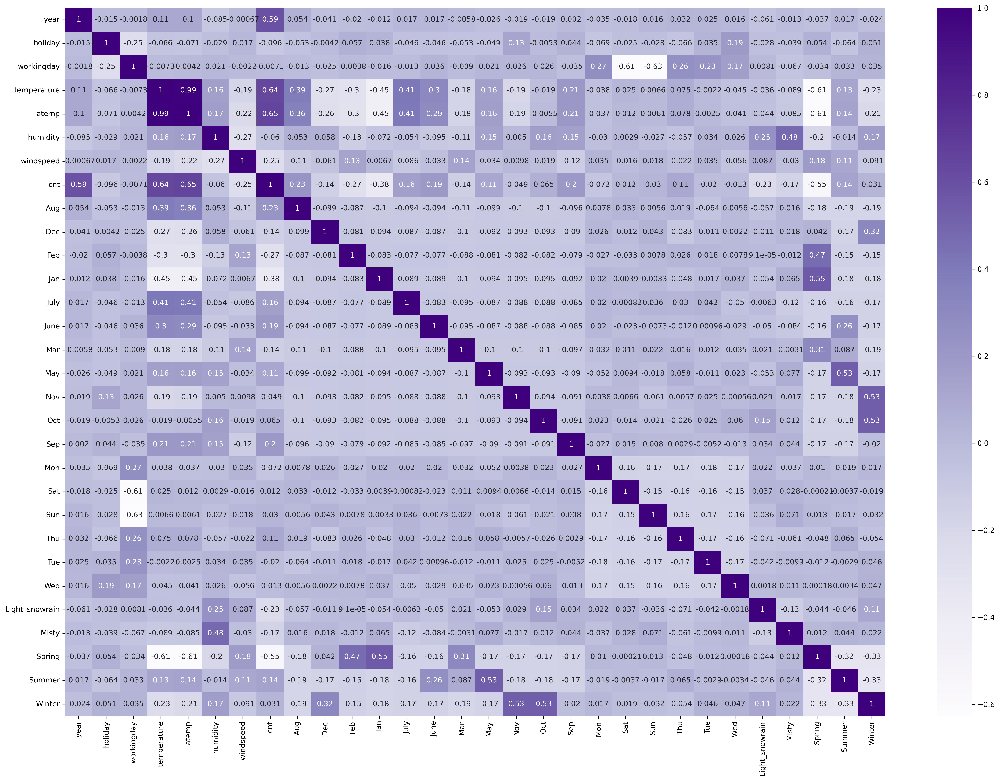

In [86]:
#Checking Correlation Coefficients Of Train Dataset

plt.figure(figsize=(21,15),dpi=300)
sns.heatmap(df_train.corr(),annot=True,cmap='Purples')
plt.tight_layout();

In [87]:
# 'cnt' is a bit correlated to 'year' and 'temperature' variable.
# 'Misty' and 'humidity' show correlation.
# 'Spring' season Shows Correlation with 'Jan' and 'Feb' month.
# 'Summer' season Shows Correlation with month 'May'.
# 'Winter' season Shows Correlation with month 'oct' and 'nov'.

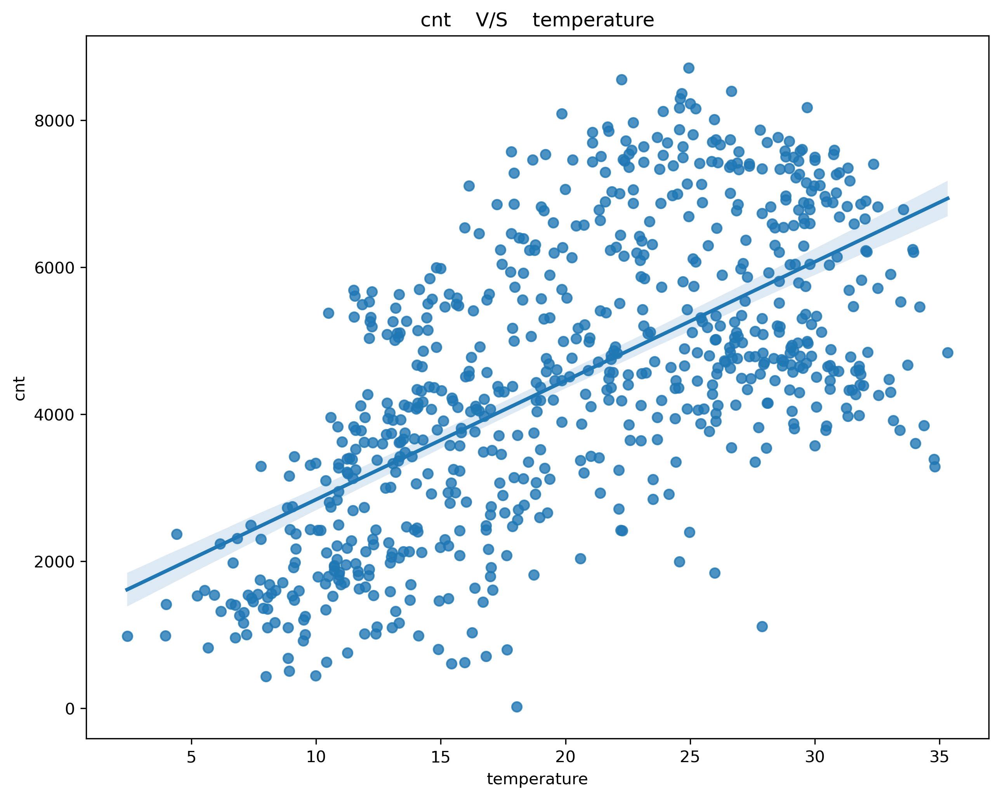

In [88]:
# # Cross-Checking Correlation
plt.figure(figsize=(10,8),dpi=300)
plt.title('cnt    V/S    temperature')
sns.regplot(x = 'temperature', y = 'cnt', data = df);

#It Can Be Clearly Seen That Demand For Bikes Is Positively Correlated To Temperature.

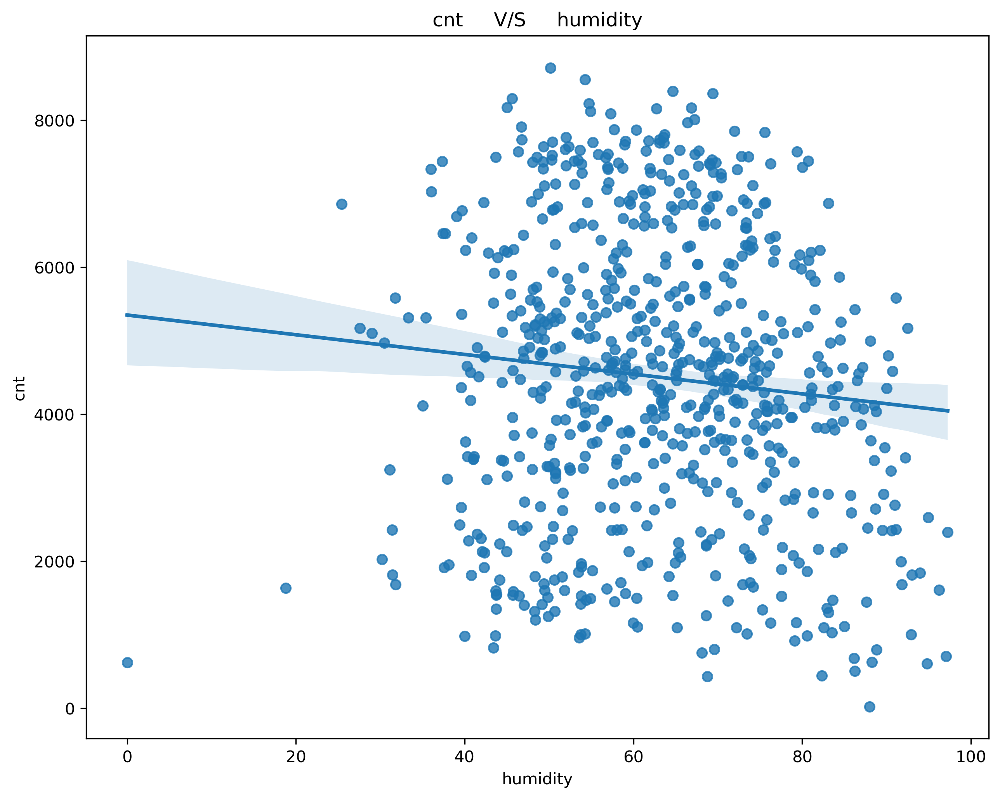

In [89]:
plt.figure(figsize=(10,8),dpi=300)
plt.title('cnt     V/S     humidity')
sns.regplot(x = 'humidity', y = 'cnt', data = df);

# 'humidity' Values Are Far Much Scattered.

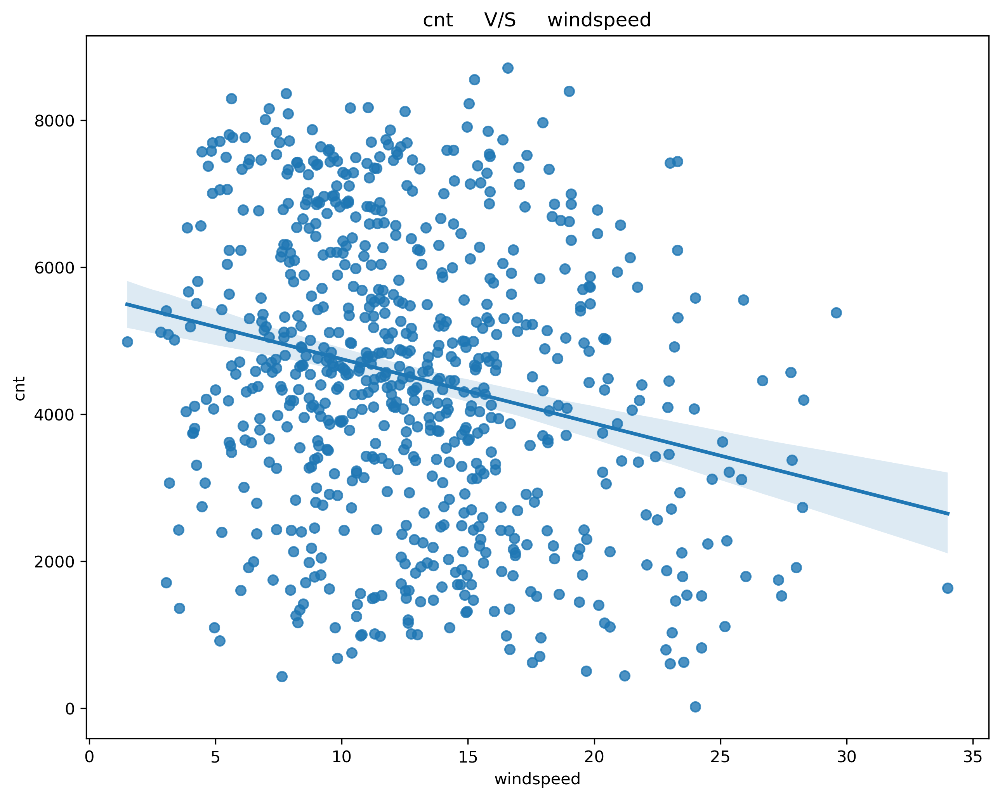

In [90]:
plt.figure(figsize=(10,8),dpi=300)
plt.title('cnt     V/S     windspeed')
sns.regplot(x = 'windspeed', y = 'cnt', data = df);

# we can see cnt decreasing with increase in windspeed and its more scattered as well.

## Linear Model

In [91]:
# Building the Linear Model

y_train = df_train.pop('cnt')
X_train = df_train

In [92]:
# Recursive feature elimination 

lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, 15)
rfe = rfe.fit(X_train, y_train)

In [93]:
# Variables Selected In Top 15 List

list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('year', True, 1),
 ('holiday', True, 1),
 ('workingday', False, 4),
 ('temperature', True, 1),
 ('atemp', False, 3),
 ('humidity', True, 1),
 ('windspeed', True, 1),
 ('Aug', False, 10),
 ('Dec', True, 1),
 ('Feb', False, 2),
 ('Jan', True, 1),
 ('July', True, 1),
 ('June', False, 12),
 ('Mar', False, 15),
 ('May', False, 9),
 ('Nov', True, 1),
 ('Oct', False, 13),
 ('Sep', True, 1),
 ('Mon', False, 8),
 ('Sat', False, 5),
 ('Sun', False, 6),
 ('Thu', False, 14),
 ('Tue', False, 7),
 ('Wed', False, 11),
 ('Light_snowrain', True, 1),
 ('Misty', True, 1),
 ('Spring', True, 1),
 ('Summer', True, 1),
 ('Winter', True, 1)]

In [94]:
# selecting the selected variable via RFE in col list

colum = X_train.columns[rfe.support_]
print(list(colum))

['year', 'holiday', 'temperature', 'humidity', 'windspeed', 'Dec', 'Jan', 'July', 'Nov', 'Sep', 'Light_snowrain', 'Misty', 'Spring', 'Summer', 'Winter']


In [95]:
# checking which columns has been rejected

print(list(X_train.columns[~rfe.support_]))

['workingday', 'atemp', 'Aug', 'Feb', 'June', 'Mar', 'May', 'Oct', 'Mon', 'Sat', 'Sun', 'Thu', 'Tue', 'Wed']


In [96]:
# Generic function to calculate VIF of variables

def cal_VIF(df):
    vif = pd.DataFrame()
    vif['Features'] = df.columns
    vif['VIF'] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False)
    return vif 

In [97]:
# dataframe with RFE selected variables

X_train_rfe = X_train[colum]

In [98]:
# calculate VIF

cal_VIF(X_train_rfe) #humidity shows high VIF value.VIF Should Be Under 5.00

,Features,VIF
3,humidity,30.93
2,temperature,17.82
4,windspeed,4.73
12,Spring,4.37
14,Winter,4.06
13,Summer,2.82
11,Misty,2.32
0,year,2.09
8,Nov,1.83
6,Jan,1.75


## Building a model.

In [99]:
# Building 1st linear regression model

X_train_lm_1 = sm.add_constant(X_train_rfe)
lr_1 = sm.OLS(y_train,X_train_lm_1).fit()
print(lr_1.summary())

                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.845
Model:                            OLS   Adj. R-squared:                  0.840
Method:                 Least Squares   F-statistic:                     180.1
Date:                Mon, 08 Aug 2022   Prob (F-statistic):          2.29e-189
Time:                        15:08:02   Log-Likelihood:                 514.84
No. Observations:                 511   AIC:                            -997.7
Df Residuals:                     495   BIC:                            -929.9
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.3206      0.036      8.

In [100]:
# As humidity shows high VIF values hence we can drop it
X_train_new = X_train_rfe.drop(['humidity'], axis = 1)

# Run the function to calculate VIF for the new model
cal_VIF(X_train_new)

,Features,VIF
2,temperature,5.18
3,windspeed,4.67
13,Winter,2.94
11,Spring,2.89
12,Summer,2.24
0,year,2.08
7,Nov,1.80
5,Jan,1.66
6,July,1.59
10,Misty,1.56


In [101]:
## Lets See If We Can Reduce VIF Further

## Building 2nd Linear Regression Model

X_train_lm_2 = sm.add_constant(X_train_new)
lr_2 = sm.OLS(y_train,X_train_lm_2).fit()
print(lr_2.summary())

## We Can See Below High 'Nov' P-Value ,Let's Remove It And Check Once More...

                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.839
Model:                            OLS   Adj. R-squared:                  0.835
Method:                 Least Squares   F-statistic:                     185.1
Date:                Mon, 08 Aug 2022   Prob (F-statistic):          1.41e-186
Time:                        15:08:02   Log-Likelihood:                 505.44
No. Observations:                 511   AIC:                            -980.9
Df Residuals:                     496   BIC:                            -917.3
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.2457      0.032      7.

In [102]:
X_train_new = X_train_new.drop(['Nov'], axis = 1)

# Run the function to calculate VIF for the new model
cal_VIF(X_train_new)

# As It Can Be Seen Below That There Is No Big Change In The Value Of VIF.
# Let's See Further.

,Features,VIF
2,temperature,5.15
3,windspeed,4.63
10,Spring,2.89
11,Summer,2.24
0,year,2.08
12,Winter,2.06
5,Jan,1.65
6,July,1.59
9,Misty,1.56
7,Sep,1.34


In [103]:
# Building 3rd linear regression model

X_train_lm_3 = sm.add_constant(X_train_new)
lr_3 = sm.OLS(y_train,X_train_lm_3).fit()
print(lr_3.summary())

                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.838
Model:                            OLS   Adj. R-squared:                  0.834
Method:                 Least Squares   F-statistic:                     197.5
Date:                Mon, 08 Aug 2022   Prob (F-statistic):          1.05e-186
Time:                        15:08:02   Log-Likelihood:                 502.99
No. Observations:                 511   AIC:                            -978.0
Df Residuals:                     497   BIC:                            -918.7
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.2280      0.031      7.

In [104]:
# We can drop dec variable as it has high p-value 0.084

X_train_new = X_train_new.drop(['Dec'], axis = 1)

# Run the function to calculate VIF for the new model
cal_VIF(X_train_new)

,Features,VIF
2,temperature,5.14
3,windspeed,4.62
9,Spring,2.75
10,Summer,2.24
0,year,2.08
11,Winter,1.79
4,Jan,1.61
5,July,1.59
8,Misty,1.56
6,Sep,1.34


In [105]:
# Building 4th linear regression model

X_train_lm_4 = sm.add_constant(X_train_new)
lr_4 = sm.OLS(y_train,X_train_lm_4).fit()
print(lr_4.summary())

                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.837
Model:                            OLS   Adj. R-squared:                  0.833
Method:                 Least Squares   F-statistic:                     212.7
Date:                Mon, 08 Aug 2022   Prob (F-statistic):          3.46e-187
Time:                        15:08:02   Log-Likelihood:                 501.35
No. Observations:                 511   AIC:                            -976.7
Df Residuals:                     498   BIC:                            -921.6
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.2147      0.030      7.

In [106]:
# We can drop jan variable as it has high p-value 0.033
X_train_new = X_train_new.drop(['Jan'], axis = 1)

# Run the function to calculate VIF for the new model
cal_VIF(X_train_new)

,Features,VIF
2,temperature,5.10
3,windspeed,4.61
9,Summer,2.23
8,Spring,2.08
0,year,2.07
10,Winter,1.79
4,July,1.58
7,Misty,1.55
5,Sep,1.34
6,Light_snowrain,1.08


In [107]:
# Building 5th linear regression model

X_train_lm_5 = sm.add_constant(X_train_new)
lr_5 = sm.OLS(y_train,X_train_lm_5).fit()
print(lr_5.summary())

                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.835
Model:                            OLS   Adj. R-squared:                  0.832
Method:                 Least Squares   F-statistic:                     230.0
Date:                Mon, 08 Aug 2022   Prob (F-statistic):          2.09e-187
Time:                        15:08:02   Log-Likelihood:                 499.05
No. Observations:                 511   AIC:                            -974.1
Df Residuals:                     499   BIC:                            -923.3
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.1988      0.030      6.

In [108]:
# We can drop july variable as it has high p-value
X_train_new = X_train_new.drop(['July'], axis = 1)

# Run the function to calculate VIF for the new model
cal_VIF(X_train_new)

# Can Be Seen Clearly That VIF Value Is Now Below 5.00 And Now Seems Perfect.

,Features,VIF
3,windspeed,4.60
2,temperature,3.84
0,year,2.07
7,Spring,1.99
8,Summer,1.90
9,Winter,1.63
6,Misty,1.55
4,Sep,1.23
5,Light_snowrain,1.08
1,holiday,1.04


In [109]:
# Building 6th linear regression model

X_train_lm_6 = sm.add_constant(X_train_new)
lr_6 = sm.OLS(y_train,X_train_lm_6).fit()
print(lr_6.summary())

                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.833
Model:                            OLS   Adj. R-squared:                  0.829
Method:                 Least Squares   F-statistic:                     248.8
Date:                Mon, 08 Aug 2022   Prob (F-statistic):          6.20e-187
Time:                        15:08:02   Log-Likelihood:                 495.07
No. Observations:                 511   AIC:                            -968.1
Df Residuals:                     500   BIC:                            -921.5
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.1902      0.030      6.

#### We can cosider the above model i.e lr_6, as it seems to have very low multicolinearity between the predictors and the p-values for all the predictors seems to be significant.
#### F-Statistics value of 248.8 (which is greater than 1) and the Prob (F-statistic) of 6.20e-187 i.e almost equals to zero, states that the overall model is significant.

In [110]:
# Checking the parameters and their coefficient values
lr_6.params

const             0.190156
year              0.234675
holiday          -0.096816
temperature       0.478454
windspeed        -0.147998
Sep               0.090823
Light_snowrain   -0.285744
Misty            -0.079210
Spring           -0.055017
Summer            0.062228
Winter            0.095955
dtype: float64

## Residual Analysis of the train data and validation¶

In [111]:
X_train_lm_6

,const,year,holiday,temperature,windspeed,Sep,Light_snowrain,Misty,Spring,Summer,Winter
653,1.0,1,0,0.509887,0.300794,0,0,0,0,0,1
576,1.0,1,0,0.815169,0.264686,0,0,0,0,0,0
426,1.0,1,0,0.442393,0.255342,0,0,1,1,0,0
728,1.0,1,0,0.245101,0.663106,0,0,0,1,0,0
482,1.0,1,0,0.395666,0.188475,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...
578,1.0,1,0,0.863973,0.187140,0,0,0,0,0,0
53,1.0,0,0,0.202618,0.111379,0,0,0,1,0,0
350,1.0,0,0,0.248216,0.431816,0,0,1,0,0,1
79,1.0,0,0,0.462664,0.529881,0,0,1,0,1,0


In [112]:
y_train_pred = lr_6.predict(X_train_lm_6)

#### Normality of Error Terms

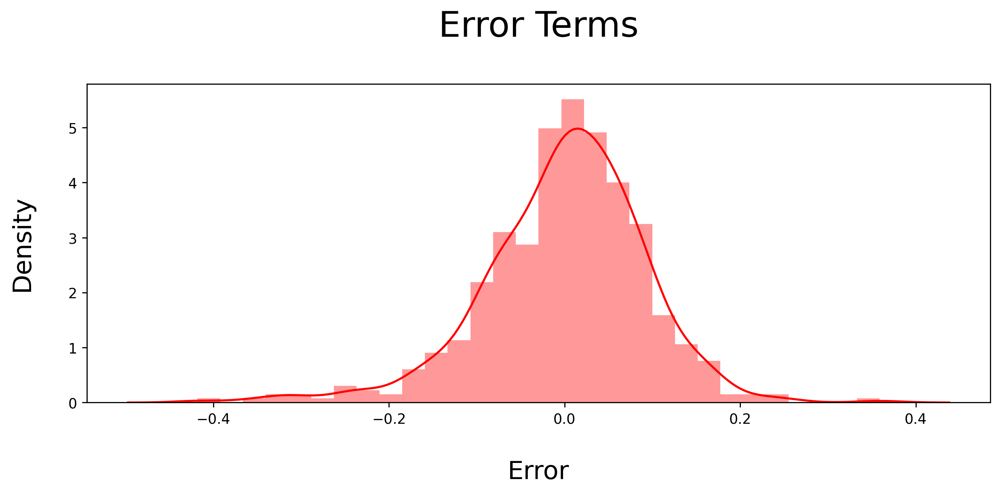

In [113]:
# Plot the histogram of the error terms

plt.figure(figsize=(10,5),dpi=250)
sns.distplot((y_train - y_train_pred), bins = 30 ,color='r')
plt.title('Error Terms\n', fontsize = 25) 
plt.xlabel('\nError', fontsize = 18)
plt.ylabel('Density\n', fontsize = 18)
plt.tight_layout();

#Can Be Clearly Seen That It's A Normal Distribution.

### Multi-Colinearity

In [114]:
cal_VIF(X_train_new)

,Features,VIF
3,windspeed,4.60
2,temperature,3.84
0,year,2.07
7,Spring,1.99
8,Summer,1.90
9,Winter,1.63
6,Misty,1.55
4,Sep,1.23
5,Light_snowrain,1.08
1,holiday,1.04


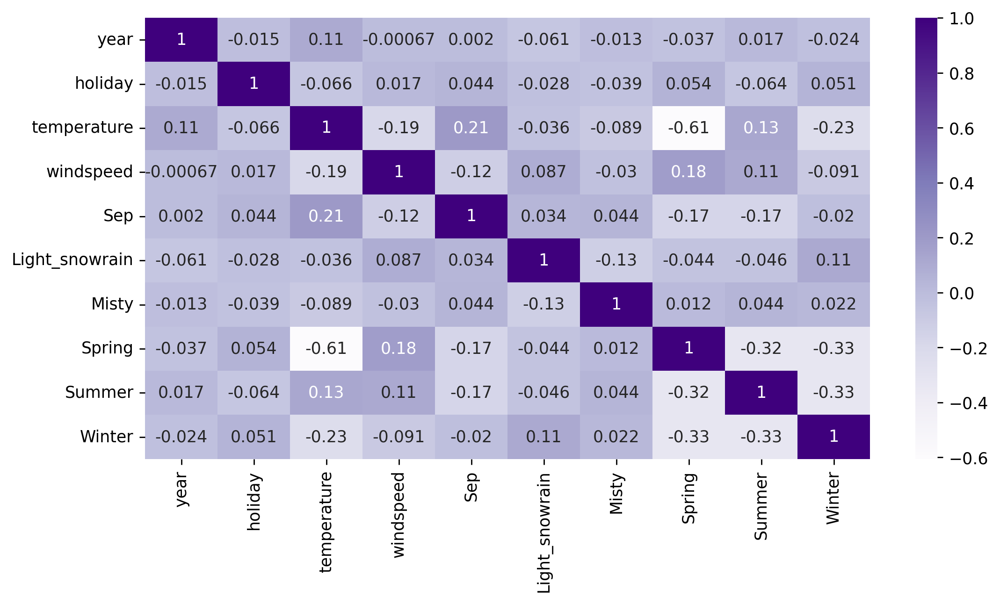

In [115]:
plt.figure(figsize=(10,5),dpi=250)
sns.heatmap(X_train_new.corr(),annot = True, cmap="Purples")
plt.show()

#### VIF value is less than 5 which is good and also there is no multicolinearity as seen in the heatmap above.

## Linearity Check

<Figure size 1250x2500 with 0 Axes>

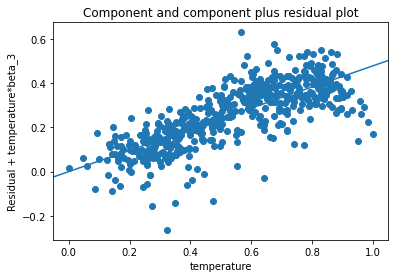

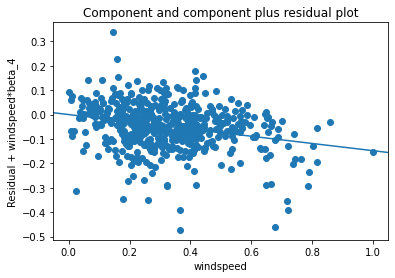

In [116]:
# Linear relationship validation using CCPR plot
# Component and component plus residual plot

plt.figure(figsize=(5,10),dpi=250)
sm.graphics.plot_ccpr(lr_6, 'temperature')
plt.show()
sm.graphics.plot_ccpr(lr_6, 'windspeed')
plt.show()

### Homoscedasticity

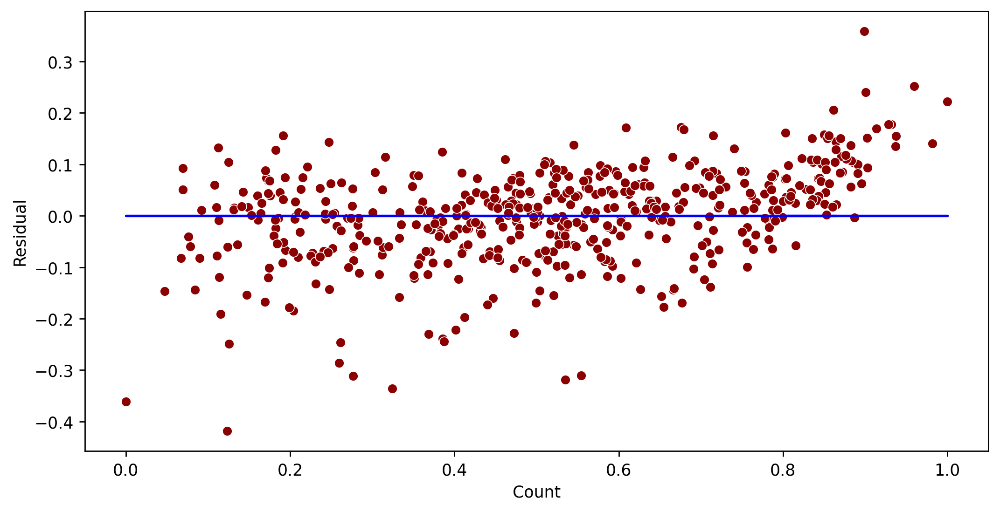

In [117]:
y_train_pred = lr_6.predict(X_train_lm_6)
residual = y_train - y_train_pred
plt.figure(figsize=(10,5),dpi=250)
sns.scatterplot(y_train,residual, color='darkred')
plt.plot(y_train,(y_train - y_train), '-b')
plt.xlabel('Count')
plt.ylabel('Residual')
plt.show()

### Prediction Test Data Values

In [118]:
# Applying scaling on the test dataset

#Scale variables in X_test
num_vars = ['temperature','atemp','humidity','windspeed','cnt']

#Test data to be transformed only, no fitting
df_test[num_vars] = scale.transform(df_test[num_vars])

In [119]:
df_test.head()

,year,holiday,workingday,temperature,atemp,humidity,windspeed,cnt,Aug,Dec,...,Sat,Sun,Thu,Tue,Wed,Light_snowrain,Misty,Spring,Summer,Winter
184,0,1,0,0.831783,0.769660,0.657364,0.084219,0.692706,0,0,...,0,0,0,0,1,0,1,0,0,0
535,1,0,1,0.901354,0.842587,0.610133,0.153728,0.712034,0,0,...,0,0,1,0,0,0,0,0,1,0
299,0,0,0,0.511964,0.496145,0.837699,0.334206,0.303382,0,0,...,1,0,0,0,0,0,1,0,0,1
221,0,0,1,0.881625,0.795343,0.437098,0.339570,0.547400,1,0,...,0,0,0,0,0,0,0,0,0,0
152,0,0,0,0.817246,0.741471,0.314298,0.537414,0.569029,0,0,...,1,0,0,0,0,0,0,0,1,0


In [120]:
df_test.describe()

,year,holiday,workingday,temperature,atemp,humidity,windspeed,cnt,Aug,Dec,...,Sat,Sun,Thu,Tue,Wed,Light_snowrain,Misty,Spring,Summer,Winter
count,219.000000,219.000000,219.000000,219.000000,219.000000,219.000000,219.000000,219.000000,219.000000,219.000000,...,219.000000,219.000000,219.000000,219.000000,219.000000,219.000000,219.000000,219.000000,219.000000,219.000000
mean,0.479452,0.036530,0.639269,0.558941,0.532991,0.638508,0.313350,0.520592,0.059361,0.086758,...,0.173516,0.155251,0.141553,0.123288,0.155251,0.027397,0.319635,0.255708,0.264840,0.232877
std,0.500722,0.188034,0.481313,0.233698,0.217888,0.148974,0.159947,0.218435,0.236840,0.282125,...,0.379560,0.362974,0.349389,0.329520,0.362974,0.163612,0.467403,0.437258,0.442259,0.423633
min,0.000000,0.000000,0.000000,0.046591,0.025950,0.261915,-0.042808,0.048205,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.354650,0.344751,0.527265,0.198517,0.377531,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,1.000000,0.558691,0.549198,0.627737,0.299459,0.524275,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,0.000000,1.000000,0.759096,0.714132,0.743928,0.403048,0.672745,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000
max,1.000000,1.000000,1.000000,0.984424,0.980934,1.002146,0.807474,0.963300,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [121]:
y_test = df_test.pop('cnt')
X_test = df_test

In [122]:
col1 = X_train_new.columns

X_test = X_test[col1]

# Adding constant variable to test dataframe
X_test_lm_6 = sm.add_constant(X_test)

In [123]:
y_pred = lr_6.predict(X_test_lm_6)

In [124]:
r2 = r2_score(y_test, y_pred)
print(f'R² Value = {round(r2,4)}')

R² Value = 0.8037


## Evaluating Model

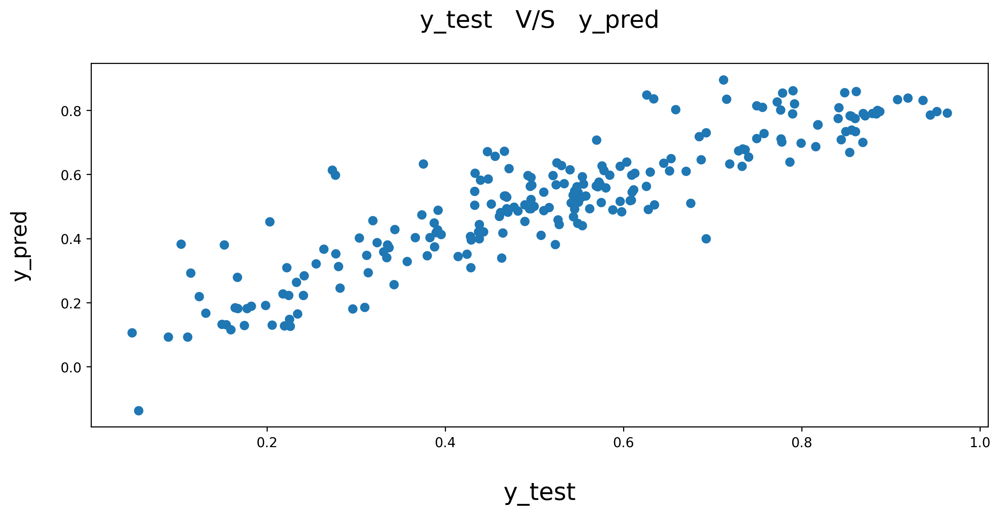

In [125]:
# Plotting y_test and y_pred to understand the spread
plt.figure(figsize=(12,5),dpi=250)
plt.scatter(y_test, y_pred)
plt.title('y_test   V/S   y_pred\n', fontsize = 18)
plt.xlabel('\ny_test', fontsize = 18)
plt.ylabel('y_pred\n', fontsize = 16)
plt.show()

## Error Terms 

In [126]:
# Error terms
def plot_err_terms(act,pred):
    c = [i for i in range(1,220,1)]
    fig = plt.figure(figsize=(20,5),dpi=250)
    plt.plot(c,act-pred, color="darkred", marker='o', linewidth=2.5, linestyle="")
    fig.suptitle('Error Terms', fontsize=20)              # Plot heading 
    plt.xlabel('Index', fontsize=18)                      # X-label
    plt.ylabel('Counts - Predicted Counts', fontsize=16)                # Y-label

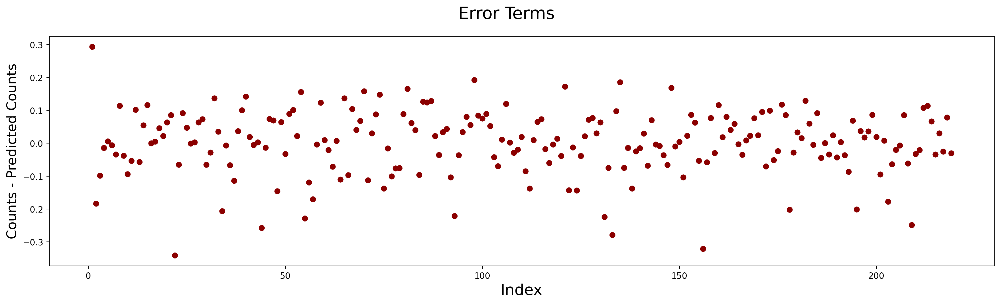

In [127]:
#Plot error terms for test data
plot_err_terms(y_test,y_pred)

#### _`Inference`_
As we can see the error terms are randomly distributed and there is no pattern which means the output is explained well by the model and there are no other parameters that can explain the model better.

In [128]:
round(lr_6.params,4)

const             0.1902
year              0.2347
holiday          -0.0968
temperature       0.4785
windspeed        -0.1480
Sep               0.0908
Light_snowrain   -0.2857
Misty            -0.0792
Spring           -0.0550
Summer            0.0622
Winter            0.0960
dtype: float64

In [129]:
# Calculating Adjusted-R^2 value for the test dataset

adjusted_r2 = round(1-(1-r2)*(X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1),4)
print(f'Adjusted R² = {adjusted_r2}')

Adjusted R² = 0.7942


# Comparing Training And Test Dataset :

- Train Dataset R²          : 0.832
- Test  Dataset R²          : 0.8037
        
*****
        
- Train Dataset Adjusted R² : 0.829    
- Test  Dataset Adjusted R² : 0.7942

### Interepretation of Results

### Analysing the above model, the comapany should focus on the following features:
- Company should focus on expanding business during Spring.
- Company should focus on expanding business during September.
- Based on previous data it is expected to have a boom in number of users once situation comes back to normal, compared to 2019.
- There would be less bookings during Light Snow or Rain.

#### Hence when the situation comes back to normal, the company should come up with new offers during spring when the weather is pleasant and also advertise a little for September as this is when business would be at its best.

### _`Conclusion`_
Significant variables predict the demand for shared bikes
- year
- holiday
- temperature
- windspeed
- Sep
- Light_snowrain
- Misty
- spring
- summer
- winter